# Sommaire :


### <a href="#C1"> **Partie 1 : Contexte et Objectifs**</a>

 - Contexte
 - Objectifs

<b><hr></b>

### <a href="#C2"> **Partie 2 : Mise en place de l'espace de travail**</a>
 - <a href="#C21"> Import des packages</a>
 - <a href="#C22"> Repertoire de travail</a>
 - <a href="#C23"> Changement du répertoire courant</a>
 - <a href="#C24"> Import des datas frames</a>

<b><hr></b>

### <a href="#C3"> **Partie 3 : Import DataFrames**</a>
 - <a href="#C31"> 3.1 Display</a>
 - <a href="#C32"> 3.2 Structure du dataframes</a>

<b><hr></b>
 
### <a href="#C4"> **Partie 4 : Extraction Features**</a>
 - <a href="#C41"> 4.1 Bags of Words</a>
     - <a href="#C411"> 4.1.1 CountVector</a>
     - <a href="#C412"> 4.1.2 TF-Idf</a>
</br></br>
 - <a href="#C42"> 4.2 Words/Sentence Embedding Classique</a>
      - <a href="#C421"> 4.2.1 Word2Vec</a>
      - <a href="#C422"> 4.2.2 Glove</a>
      - <a href="#C423"> 4.2.3 FastText</a>
      - <a href="#C424"> 4.2.4 Autres modélisations de sujets</a>
</br></br>
 - <a href="#C43"> 4.3 Words/Sentence Embedding</a>
      - <a href="#C431"> 4.2.3 BERT</a>
      - <a href="#C432"> 4.2.4 Universel Sentence Embedding</a>
</br>

 
<b><hr></b>



# <a name="C1">**Partie 1 : Contexte et Objectifs**</a> 

Contexte

Objectifs

In [1]:
from platform import python_version

print(python_version())

3.10.9


# <a name="C2"><font color='blue'>**Partie 2 : Mise en place de l'espace de travail**</font></a> 

### <a name="C21"><font color='blue'>2.1 Imports packages</font></a> 

###### <b><font color='blue'>2.1.0 Requirements</font></b>
- <b>Built-in</b>       : os, warnings
- <b>Data</b>           : pandas, numpy
- <b>Visualisations</b> : matplotlib, seaborn
- <b>Preprocessing</b>  : sklearn, scipy

###### <b><font color='blue'>2.1.1 Imports</font></b>

In [2]:
# Built-in
import os, warnings 

# Data
import numpy as np
import pandas as pd

#Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from PIL import Image
#%matplotlib inline

# NLP
import nltk #/!\ attention use nltk.download('punkt')
from nltk.stem.snowball import EnglishStemmer
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize, wordpunct_tokenize, RegexpTokenizer
from nltk.corpus import words, stopwords

import spacy
import re

#cluster
from sklearn.cluster import KMeans,MiniBatchKMeans, DBSCAN

#metrics
from sklearn.metrics import (silhouette_samples,silhouette_score, adjusted_rand_score,
                             adjusted_mutual_info_score,confusion_matrix, pair_confusion_matrix,
                            ConfusionMatrixDisplay)

###### <b><font color='blue'>2.1.2 Downloads and Options</font></b>

In [3]:
# La cpu_count méthode est utilisée pour renvoyer le nombre actuel de CPU logiques dans le système.
import psutil
print("The number of physical cores in the system is %s" % (psutil.cpu_count(logical=False),))
print("The number of logical cores in the system is %s" % (psutil.cpu_count(logical=True),))

The number of physical cores in the system is 6
The number of logical cores in the system is 12


In [4]:
# init sns
sns.set()

### <a name="C22"><font color='blue'>2.2 Working directory</font></a> 

In [5]:
os.listdir()

['.git',
 '.gitignore',
 '.ipynb_checkpoints',
 'API rapidPI.ipynb',
 'bestmodel3.h5',
 'data',
 'EDA.ipynb',
 'Feature_extraction_faisaibilité-Image.ipynb',
 'Feature_extraction_faisaibilité-Text.ipynb',
 'Feature_extraction_faisaibilité-Transfert learning.ipynb',
 'model1_best_weights.h5',
 'model2_best_weights.h5',
 'model3_best_weights.h5',
 'model4_best_weights.h5',
 'OC-DS-P6-Classifiez-automatiquement-des-biens-de-consommation.ipynb',
 'pretraitement_feature_extraction_faisaibilité.ipynb',
 'README.md',
 'standard.png',
 'stop_words.pkl',
 'tfidf.pkl',
 "Étude de la faisabilité d'un moteur de classification.pptx"]

# <a name="C3"><font color='teal'>**Partie 3 : Import DataFrames**</font></a> 

In [6]:
import pickle
try:
    with open('data/cleaned/description_cleaned_spacy.pkl', 'rb') as f1:
        df = pickle.load(f1)
except:
    df = pd.read_csv('data/cleaned/description_cleaned_spacy.csv')


In [7]:
df.head()

,uniq_id,image,description,description_clean,cat_1
0,55b85ea15a1536d46b7190ad6fff8ce7,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,"[key, feature, elegance, polyester, multicolor...",home furnishing
1,7b72c92c2f6c40268628ec5f14c6d590,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,"[specification, cotton, bath, towel, bath, tow...",baby care
2,64d5d4a258243731dc7bbb1eef49ad74,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,"[key, feature, cotton, terry, face, towel, set...",baby care
3,d4684dcdc759dd9cdf41504698d737d8,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[key, feature, royal, fashion, cotton, print, ...",home furnishing
4,6325b6870c54cd47be6ebfbffa620ec7,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,"[key, feature, print, cotton, floral, king, si...",home furnishing


In [8]:
print("Dimension du dataframe importé {0} lignes {1} colonnes:".format(df.shape[0],df.shape[1]) )

Dimension du dataframe importé 1050 lignes 5 colonnes:


### <a name="C31"><font color='teal'>3.1 Display</font></a>

In [9]:
df.head(2)

,uniq_id,image,description,description_clean,cat_1
0,55b85ea15a1536d46b7190ad6fff8ce7,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,"[key, feature, elegance, polyester, multicolor...",home furnishing
1,7b72c92c2f6c40268628ec5f14c6d590,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,"[specification, cotton, bath, towel, bath, tow...",baby care


In [10]:
df.sample(2)

,uniq_id,image,description,description_clean,cat_1
220,32cf0691248297655e2c1728b12e2262,32cf0691248297655e2c1728b12e2262.jpg,Poppins Printed Baby Boy's Jumpsuit\r\n ...,"[print, baby, boy, quality, sleeve, romper, su...",baby care
830,4354b7418ee0fab2fd9f8eb493556529,4354b7418ee0fab2fd9f8eb493556529.jpg,Memore Portable and Flexible MMULL-White USB L...,"[portable, flexible, white, lead, light, white...",computers


### <a name="C32"><font color='teal'>3.2 Structure du dataframe</font></a> 

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   uniq_id            1050 non-null   object
 1   image              1050 non-null   object
 2   description        1050 non-null   object
 3   description_clean  1050 non-null   object
 4   cat_1              1050 non-null   object
dtypes: object(5)
memory usage: 41.1+ KB


In [12]:
# Analyse de la classe des entité des pd.Series
df.apply(lambda x:type(x[0]))

uniq_id               <class 'str'>
image                 <class 'str'>
description           <class 'str'>
description_clean    <class 'list'>
cat_1                 <class 'str'>
dtype: object

In [13]:
%whos

Variable                     Type                Data/Info
----------------------------------------------------------
ConfusionMatrixDisplay       type                <class 'sklearn.metrics._<...>.ConfusionMatrixDisplay'>
DBSCAN                       type                <class 'sklearn.cluster._dbscan.DBSCAN'>
EnglishStemmer               ABCMeta             <class 'nltk.stem.snowball.EnglishStemmer'>
Image                        module              <module 'PIL.Image' from <...>packages\\PIL\\Image.py'>
KMeans                       ABCMeta             <class 'sklearn.cluster._kmeans.KMeans'>
MiniBatchKMeans              ABCMeta             <class 'sklearn.cluster._kmeans.MiniBatchKMeans'>
PorterStemmer                ABCMeta             <class 'nltk.stem.porter.PorterStemmer'>
RegexpTokenizer              ABCMeta             <class 'nltk.tokenize.regexp.RegexpTokenizer'>
WordCloud                    type                <class 'wordcloud.wordcloud.WordCloud'>
WordNetLemmatizer        

</br>

</br>

In [14]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [15]:
df.description[843]

'Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219 online. Epresent Mfan 1 Fan USB USB Fan at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.'

# <a name="C4"><font color='green'>**Partie 4 : Extraction Features**</font></a> 

## Fonction utils

In [16]:
def vectorize(list_of_docs, model):
    """Generate vectors for list of documents using a Word Embedding

    Args:
        list_of_docs: List of documents
        model: Gensim's Word Embedding

    Returns:
        List of document vectors
    """
    features = []

    for tokens in list_of_docs:
        zero_vector = np.zeros(model.vector_size)
        vectors = []
        for token in tokens:
            if token in model:
                try:
                    vectors.append(model[token])
                except KeyError:
                    continue
        if vectors:
            vectors = np.asarray(vectors)
            avg_vec = vectors.mean(axis=0)
            features.append(avg_vec)
        else:
            features.append(zero_vector)
    return features

In [17]:
def mbkmeans_clusters(
    X, 
    k, 
    # mb, 
    print_silhouette_values, 
):
    """Generate clusters and print Silhouette metrics using MBKmeans

    Args:
        X: Matrix of features.
        k: Number of clusters.
        mb: Size of mini-batches.
        print_silhouette_values: Print silhouette values per cluster.

    Returns:
        Trained clustering model and labels based on X.
    """
    km = KMeans(n_clusters=k, init = 'k-means++',n_init=10).fit(X)
    print(f"For n_clusters = {k}")
    print(f"Silhouette coefficient: {silhouette_score(X, km.labels_):0.2f}")
    print(f"Inertia:{km.inertia_}")

    if print_silhouette_values:
        sample_silhouette_values = silhouette_samples(X, km.labels_)
        print(f"Silhouette values:")
        silhouette_values = []
        for i in range(k):
            cluster_silhouette_values = sample_silhouette_values[km.labels_ == i]
            silhouette_values.append(
                (
                    i,
                    cluster_silhouette_values.shape[0],
                    cluster_silhouette_values.mean(),
                    cluster_silhouette_values.min(),
                    cluster_silhouette_values.max(),
                )
            )
        silhouette_values = sorted(
            silhouette_values, key=lambda tup: tup[2], reverse=True
        )
        for s in silhouette_values:
            print(
                f"    Cluster {s[0]}: Size:{s[1]} | Avg:{s[2]:.2f} | Min:{s[3]:.2f} | Max: {s[4]:.2f}"
            )
    return km, km.labels_

In [18]:
def ARI_fct_raw(x_label_clust,x_label_true):
    ARI = np.round(adjusted_rand_score(x_label_clust, x_label_true),4)
    print("ARI : ", ARI)
    return(ARI)

In [19]:
import time
from sklearn import cluster, metrics
from sklearn import manifold, decomposition

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features) :
    time1 = time.time()
    num_labels=len(l_cat)
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=1000, 
                                 init='pca', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI) :
    fig = plt.figure(figsize=(20,12))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y_cat_num, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=l_cat, loc="best", title="Categorie")
    plt.title('Représentation des produits par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")
    plt.title('Représentation des produits par clusters')
    
    plt.show()
    print("ARI : ", ARI)


In [20]:
def plot_confusion_matrix( y_true, y_pred, class_labels=None, display_labels=None, sample_weight=None,
                            normalize_f='true',        # --> option {'all', 'count', 'percent', None}
                            cmap='Blues',
                            ax=None,
                            title=None,
                            show_values='all',      # --> option {'all', 'true', 'pred'}
                            show_colorbar=True,     # --> option {True, False}
                            show_subtotals=True):   # --> option {True, False}
    
    fig = plt.figure(figsize=(15,6))
    ax1 = fig.add_subplot(111)
    
    disp = ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                                                   xticks_rotation='vertical',
                                                   normalize=normalize_f, 
                                                   display_labels=class_labels,cmap=plt.cm.Blues,
                                                  ax=ax1)
    disp.ax_.set_title('Confusion matrix, without normalization')
    disp.ax_.set_xticklabels(range(7),rotation=0)

### Parametres utiles

In [21]:
l_cat = list(set(df['cat_1']))
print("catégories : ", l_cat)
y_cat_num = [(l_cat.index(df.iloc[i]['cat_1'])) for i in range(len(df))]

catégories :  ['home decor & festive needs', 'watches', 'baby care', 'computers', 'beauty and personal care', 'home furnishing', 'kitchen & dining']


In [22]:
set(y_cat_num)

{0, 1, 2, 3, 4, 5, 6}

### <a name="C41"><font color='green'>4.1 Bag Of Words </font></a> 

### - <a name="C411"><font color='green'>4.1.a Comptage de mots 1-gram </font></a> 

In [23]:
from sklearn.feature_extraction.text import CountVectorizer

#class LemmaTokenizer(object):
#    def __init__(self):
#        self.wnl = WordNetLemmatizer()
#    def __call__(self, articles):
#        return [self.wnl.lemmatize(t) for t in word_tokenize(articles)]

def LemmaTokenizer(articles):
    wnl = WordNetLemmatizer()
    return [wnl.lemmatize(t.lower()) for t in word_tokenize(articles)]

nlp = spacy.load('en_core_web_sm')

vectorizer = CountVectorizer(input='content', # the input is expected to be a sequence of items that can be of type string or byte
                             encoding='utf-8', 
                             decode_error='replace', #Instruction sur ce qu'il faut faire si une séquence d'octets est donnée à analyser qui contenant 
                             #des caractères n'appartenant pas à la donnée "encoding"
                             strip_accents='unicode', # Remove accents and perform other character normalization during the preprocessing step.
                             lowercase=True, # Convert all characters to lowercase before tokenizing
                             preprocessor=None, 
                             tokenizer=None, 
                             #stop_words='english',            
                             token_pattern = r"\b[a-zA-Z]{3,}\b", #ascii only alpha
                             #token_pattern = r"(?u)\b[a-zA-Z]+\b", #ascii only alpha
                             ngram_range=(1, 1), 
                             analyzer='word', 
                             max_df=351, 
                             min_df=3, #0.0013, # < 1.5/1050
                             max_features=None,
                             vocabulary=None, 
                             binary=False )

vecX = vectorizer.fit_transform( df.description.apply(lambda x: " ".join([token.lemma_ for token in nlp(x.lower())]) ) )

CountWord = pd.DataFrame( vecX.toarray(), columns=vectorizer.get_feature_names_out() )

print("Notre dataset est composé de {} lignes et {} colonnes".format(CountWord.shape[0],CountWord.shape[1]) )
CountWord.head()

Notre dataset est composé de 1050 lignes et 1415 colonnes


,aapno,able,about,above,absorbent,abstract,accessory,accord,across,act,...,yardley,year,yellow,yes,yet,you,your,yourself,youthful,zyxel
0,0,0,0,0,0,4,0,0,0,0,...,0,0,0,0,0,5,2,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,2,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,3,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,1,0,0,0


In [24]:
# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringCountVec, CountVeccluster_labels = mbkmeans_clusters(
    X=CountWord,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(CountVeccluster_labels,df.cat_1)

C:\Users\eleor\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


For n_clusters = 7
Silhouette coefficient: 0.33
Inertia:93136.15679694088
Silhouette values:
    Cluster 6: Size:11 | Avg:0.91 | Min:0.90 | Max: 0.93
    Cluster 0: Size:7 | Avg:0.76 | Min:0.09 | Max: 0.87
    Cluster 2: Size:733 | Avg:0.51 | Min:0.13 | Max: 0.63
    Cluster 4: Size:20 | Avg:0.42 | Min:-0.02 | Max: 0.60
    Cluster 5: Size:5 | Avg:0.41 | Min:0.08 | Max: 0.55
    Cluster 3: Size:97 | Avg:-0.18 | Min:-0.41 | Max: -0.01
    Cluster 1: Size:177 | Avg:-0.19 | Min:-0.43 | Max: -0.01


Score ARI sur Avant diminution de dimension
ARI :  0.0424


In [25]:
print("Most representative terms per cluster (based on centroids):")
for i in range(7):
    tokens_per_cluster = ""
    most_representative = CountWord.columns[np.argsort( clusteringCountVec.cluster_centers_[i] )[:5]]
    for t in most_representative:
        tokens_per_cluster += f"{t} "
    print(f"Cluster {i}: {tokens_per_cluster}")

Most representative terms per cluster (based on centroids):
Cluster 0: material woman ideal yes style 
Cluster 1: blanket bowl fan order together 
Cluster 2: shirt smartpro before pick mouse 
Cluster 3: dress jewellery party vaio vgn 
Cluster 4: cotton analog inch cover boy 
Cluster 5: material mug pack color ceramic 
Cluster 6: watch warranty package general this 


In [26]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(CountWord)

Score ARI après TSNE 2D + Clustering


C:\Users\eleor\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.4082 time :  7.0


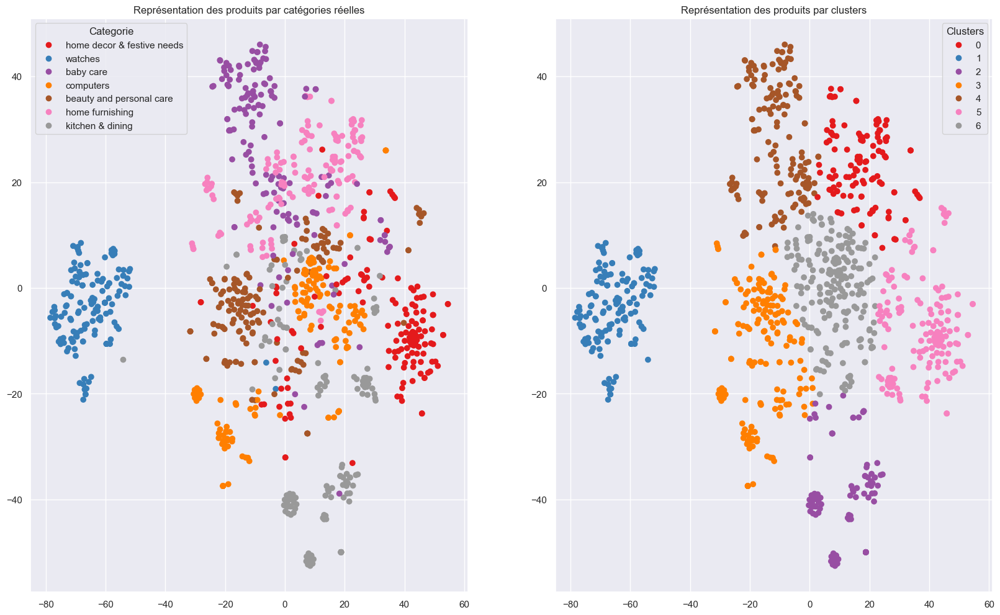

ARI :  0.4082


In [27]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

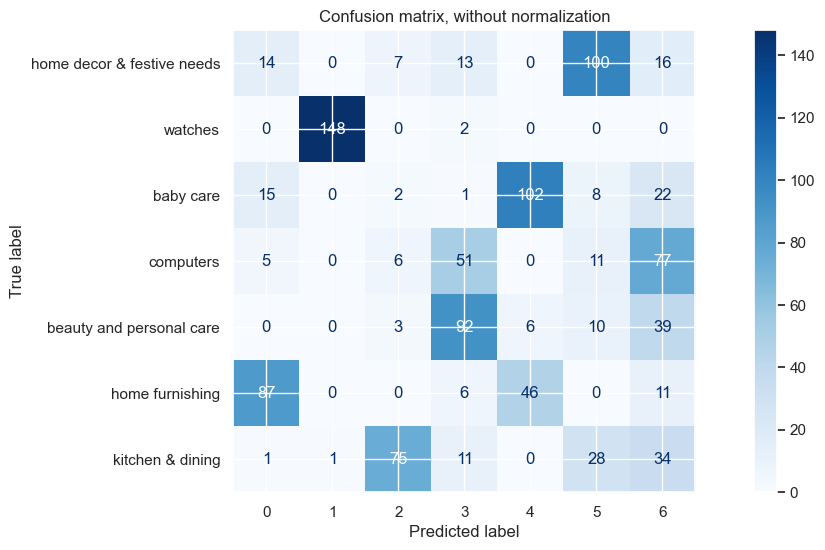

In [28]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

(1050, 1415)
(1050, 387)
Score ARI après TSNE 2D + Clustering


C:\Users\eleor\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3946 time :  7.0


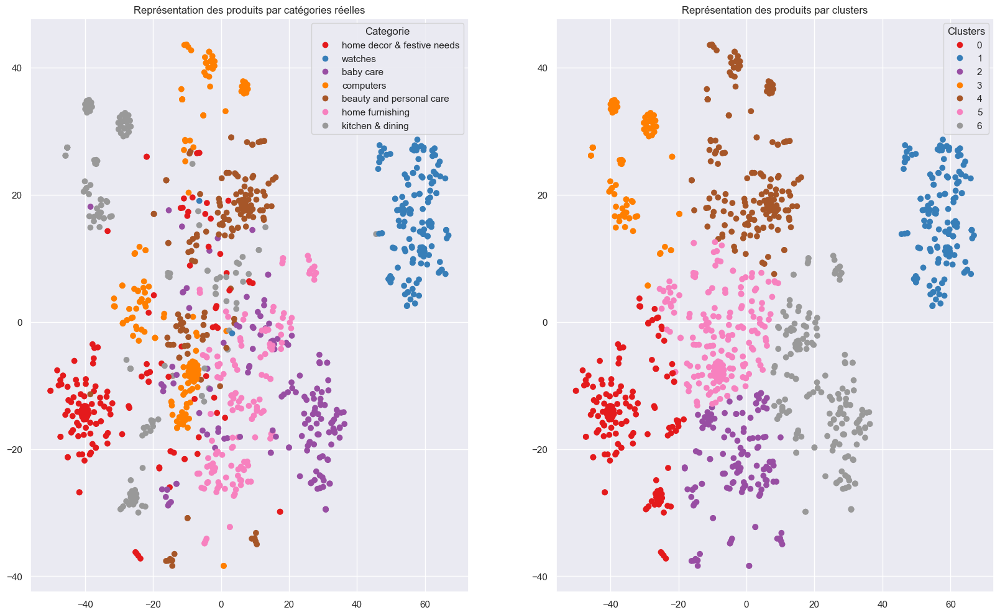

ARI :  0.3946


In [29]:
from sklearn import manifold, decomposition

print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(CountWord)
print(feat_pca.shape)

print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

</Br>

### - <a name="C412"><font color='green'>4.1.b TF IDF </font></a> 

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(
    input='content', # the input is expected to be a sequence of items that can be of type string or byte
    encoding='utf-8', 
    decode_error='replace', 
    strip_accents='ascii', # Remove accents and perform other character normalization during the preprocessing step.
    lowercase=True, # Convert all characters to lowercase before tokenizing
    preprocessor=None, 
    stop_words="english", 
    token_pattern = r"\b[a-zA-Z]{3,}\b", #ascii only alpha
    #tokenizer = RegexpTokenizer(r"[a-zA-Z]{3,}").tokenize,
    tokenizer=None,
    ngram_range=(1, 1), 
    analyzer='word', 
    max_df=351, 
    min_df=3, # < 1.5/1050
    max_features=None,
    vocabulary=None, binary=False ,
    smooth_idf = True
    )
tfidf_values = tfidf.fit_transform( df.description.apply(lambda x: " ".join([token.lemma_ for token in nlp(x.lower())]) ) )

TFIDF_df = pd.DataFrame(tfidf_values.toarray(),columns=tfidf.get_feature_names_out())

TFIDF_df.head()

,aapno,able,absorbent,abstract,accessory,accord,act,actual,adapter,adaptor,...,wow,wrap,wrapper,wrist,yardley,year,yellow,yes,youthful,zyxel
0,0.0,0.0,0.0,0.180981,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.0,0.0
1,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.19766,0.077455,0.0,0.0
2,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.046775,0.00000,0.000000,0.0,0.0
3,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.045724,0.0,0.0
4,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.037574,0.0,0.0


In [31]:
# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringTFIDF, TFIDFcluster_labels = mbkmeans_clusters(
    X=TFIDF_df,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(TFIDFcluster_labels,df.cat_1)

C:\Users\eleor\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


For n_clusters = 7
Silhouette coefficient: 0.08
Inertia:878.0215240880503
Silhouette values:
    Cluster 0: Size:75 | Avg:0.25 | Min:0.11 | Max: 0.33
    Cluster 6: Size:147 | Avg:0.20 | Min:0.06 | Max: 0.31
    Cluster 5: Size:46 | Avg:0.19 | Min:0.07 | Max: 0.27
    Cluster 1: Size:87 | Avg:0.12 | Min:0.04 | Max: 0.28
    Cluster 4: Size:58 | Avg:0.10 | Min:0.02 | Max: 0.18
    Cluster 2: Size:193 | Avg:0.05 | Min:0.01 | Max: 0.10
    Cluster 3: Size:444 | Avg:0.00 | Min:-0.05 | Max: 0.03


Score ARI sur Avant diminution de dimension
ARI :  0.272


In [32]:
print("Most representative terms per cluster (based on centroids):")
for i in range(7):
    tokens_per_cluster = ""
    most_representative = CountWord.columns[np.argsort( clusteringTFIDF.cluster_centers_[i] )[:5]]
    for t in most_representative:
        tokens_per_cluster += f"{t} "
    print(f"Cluster {i}: {tokens_per_cluster}")

Most representative terms per cluster (based on centroids):
Cluster 0: tenda hard indian layer hook 
Cluster 1: tenda foot cable available indian 
Cluster 2: tenda cable indian available shampoo 
Cluster 3: indian science spray bucket level 
Cluster 4: tenda foot cable layer above 
Cluster 5: foot above cable bedroom choose 
Cluster 6: refund indian mount resistant ring 


In [33]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(TFIDF_df)

Score ARI après TSNE 2D + Clustering


C:\Users\eleor\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.5559 time :  6.0


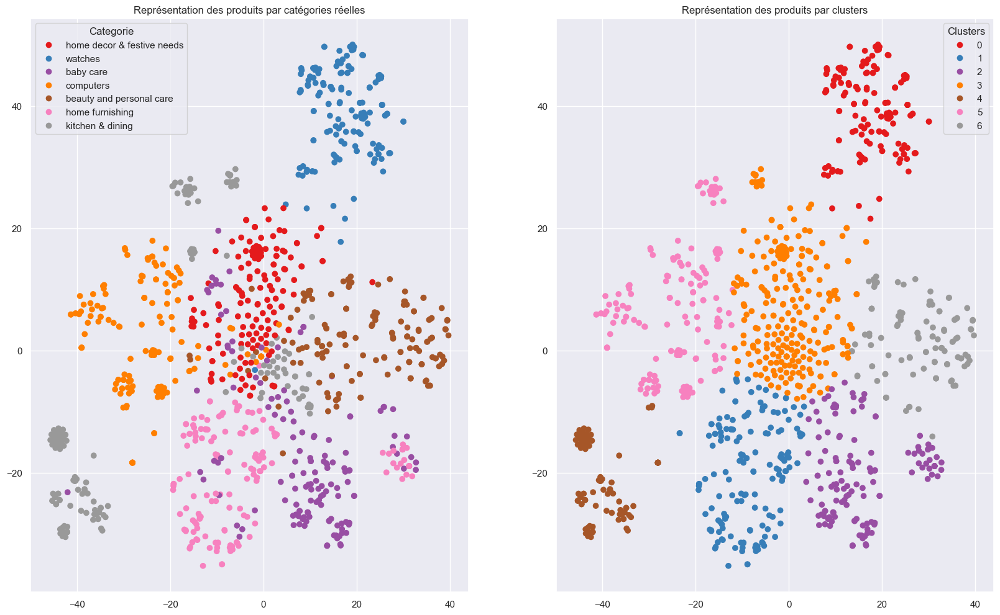

ARI :  0.5559


In [34]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

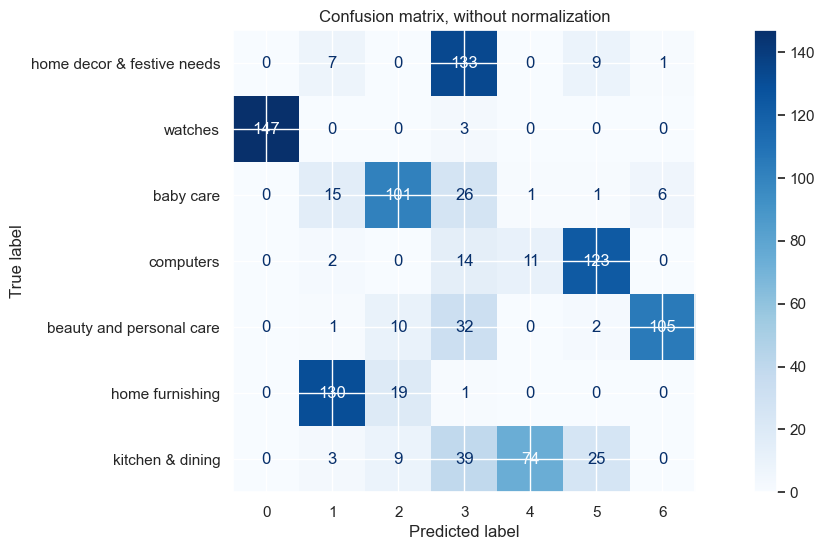

In [35]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 559)
Score ARI après PCA + TSNE 2D + Clustering


C:\Users\eleor\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.5491 time :  6.0


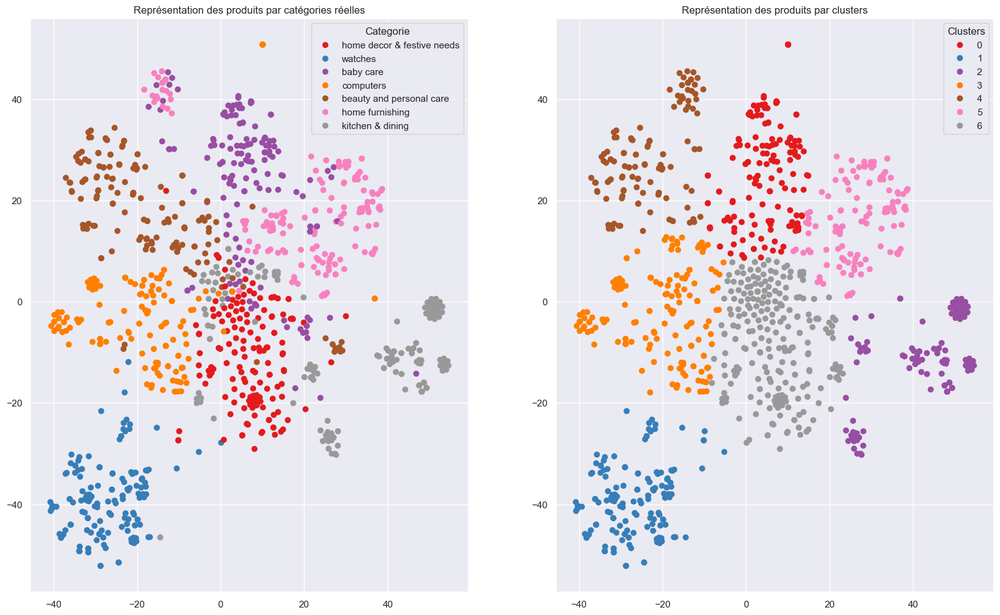

ARI :  0.5491


In [36]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(TFIDF_df)
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

</Br>

### <a name="C42"><font color='green'>4.2 Word/Sentence embedding </font></a> 

### - <a name="C421"><font color='green'>4.2.a Word2Vec </font></a> 

### <font color='green'> Model entrainé localement </font>

In [37]:
from gensim.models import Word2Vec

print("Entrainement du model Word2Vec...")
model_W2V = Word2Vec(sentences=df.description_clean, vector_size =100, window=5, min_count=1, workers=4)
model_W2V.train(df.description_clean, total_examples=len(df.description_clean), epochs=50)

Entrainement du model Word2Vec...


(1475580, 1805750)

In [39]:
model_W2V.save('modelW2v_loctrain.h5')

In [38]:
vectorized_docs = vectorize(df.description_clean, model=model_W2V.wv)

# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringW2V, W2Vcluster_labels = mbkmeans_clusters(
    X=vectorized_docs,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(W2Vcluster_labels,df.cat_1)

C:\Users\eleor\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


For n_clusters = 7
Silhouette coefficient: 0.24
Inertia:11481.807778240567
Silhouette values:
    Cluster 1: Size:137 | Avg:0.53 | Min:0.12 | Max: 0.61
    Cluster 6: Size:82 | Avg:0.47 | Min:0.19 | Max: 0.58
    Cluster 5: Size:75 | Avg:0.39 | Min:0.15 | Max: 0.46
    Cluster 4: Size:254 | Avg:0.24 | Min:0.05 | Max: 0.39
    Cluster 2: Size:110 | Avg:0.16 | Min:-0.04 | Max: 0.31
    Cluster 3: Size:171 | Avg:0.11 | Min:-0.14 | Max: 0.26
    Cluster 0: Size:221 | Avg:0.03 | Min:-0.15 | Max: 0.17


Score ARI sur Avant diminution de dimension
ARI :  0.3296


In [39]:
print("Most representative terms per cluster (based on centroids):")
for i in range(7):
    tokens_per_cluster = ""
    most_representative = model_W2V.wv.most_similar(positive=[clusteringW2V.cluster_centers_[i]], topn=10)
    for t in most_representative:
        tokens_per_cluster += f"{t[0]} "
    print(f"Cluster {i}: {tokens_per_cluster}")

Most representative terms per cluster (based on centroids):
Cluster 0: rolling trident clue authorize sailor raja thriller ravish vincent fix 
Cluster 1: watch man sonata discount maxima mac tag derivative buckle decker 
Cluster 2: single wrapper offspring duvet abstract comforter geometric assorted floral quilt 
Cluster 3: number length model grey maroon package dimension color type code 
Cluster 4: kosher raja guarantee believe emboss dynamic playboy couple router player 
Cluster 5: mug coffee ceramic china legend bone league birthday love volume 
Cluster 6: baby detail short sleeve girl dress neck pattern line frock 


In [40]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(vectorized_docs))

Score ARI après TSNE 2D + Clustering


C:\Users\eleor\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.54 time :  6.0


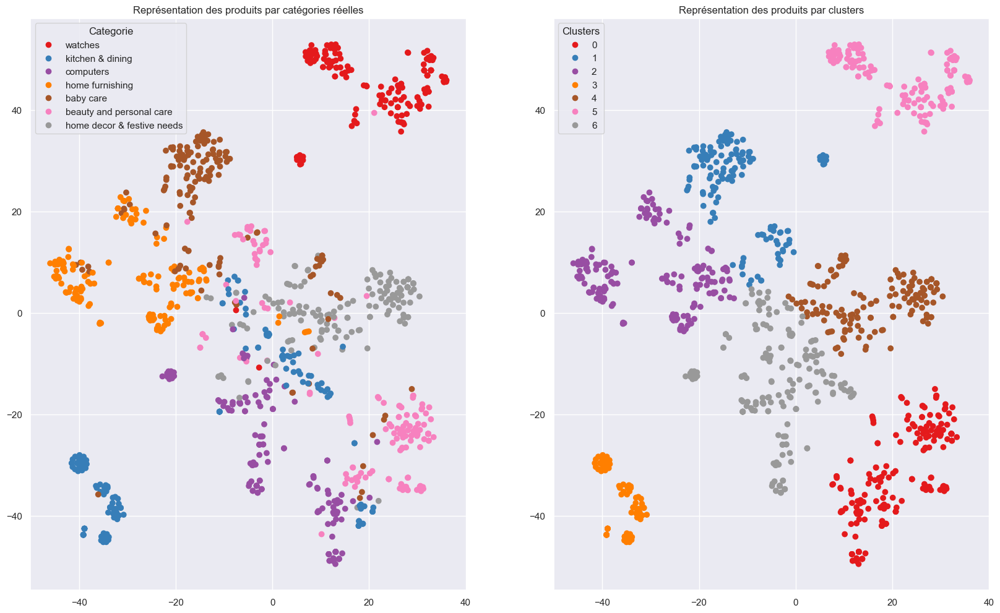

ARI :  0.54


In [41]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

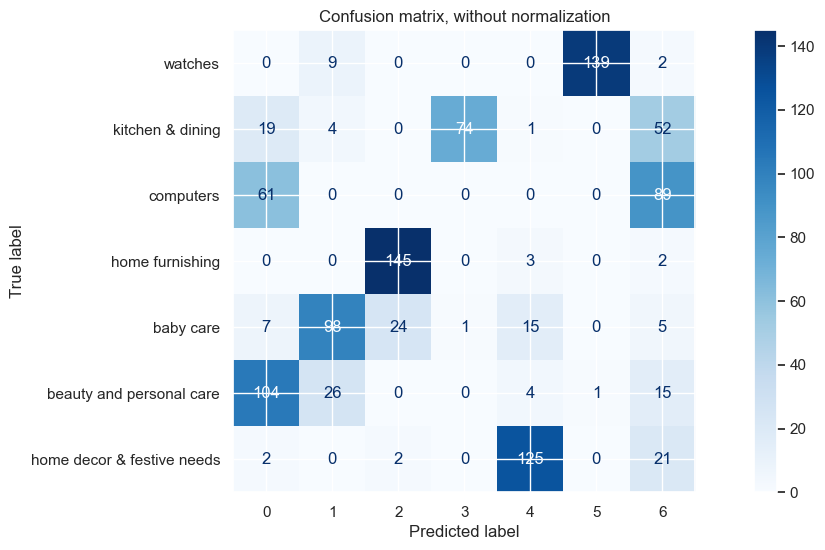

In [42]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 42)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.5227 time :  6.0


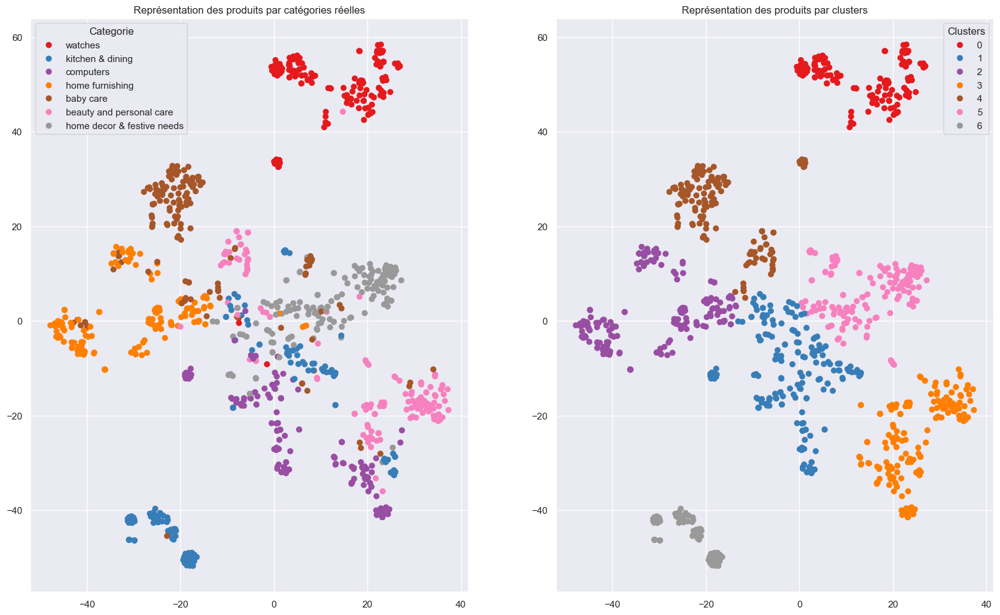

ARI :  0.5227


In [43]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(vectorized_docs))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

</Br>

### <font color='green'> Model W2V pré-entrainé de google </font>

In [44]:
%%time
from gensim.models import KeyedVectors
modelpw2wgoogle = KeyedVectors.load_word2vec_format('data/support/Word2Vec/GoogleNews-vectors-negative300.bin', binary=True)

CPU times: total: 26.1 s
Wall time: 26.1 s


In [45]:
# A partir du model, pour chaque document on recupère et on moyenne les vecteurs des token du document
vectorized_docs = vectorize(df.description_clean, model=modelpw2wgoogle)

# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringW2Vpre, W2Vprecluster_labels = mbkmeans_clusters(
    X=vectorized_docs,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(W2Vprecluster_labels,df.cat_1)

For n_clusters = 7
Silhouette coefficient: 0.10
Inertia:706.7420700610821
Silhouette values:
    Cluster 3: Size:47 | Avg:0.51 | Min:0.21 | Max: 0.66
    Cluster 0: Size:137 | Avg:0.25 | Min:0.05 | Max: 0.40
    Cluster 5: Size:60 | Avg:0.20 | Min:-0.01 | Max: 0.41
    Cluster 1: Size:54 | Avg:0.13 | Min:-0.04 | Max: 0.26
    Cluster 4: Size:214 | Avg:0.11 | Min:-0.03 | Max: 0.21
    Cluster 6: Size:375 | Avg:0.04 | Min:-0.10 | Max: 0.13
    Cluster 2: Size:163 | Avg:-0.05 | Min:-0.23 | Max: 0.09


Score ARI sur Avant diminution de dimension
ARI :  0.295


In [46]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(vectorized_docs))

Score ARI après TSNE 2D + Clustering
ARI :  0.4581 time :  7.0


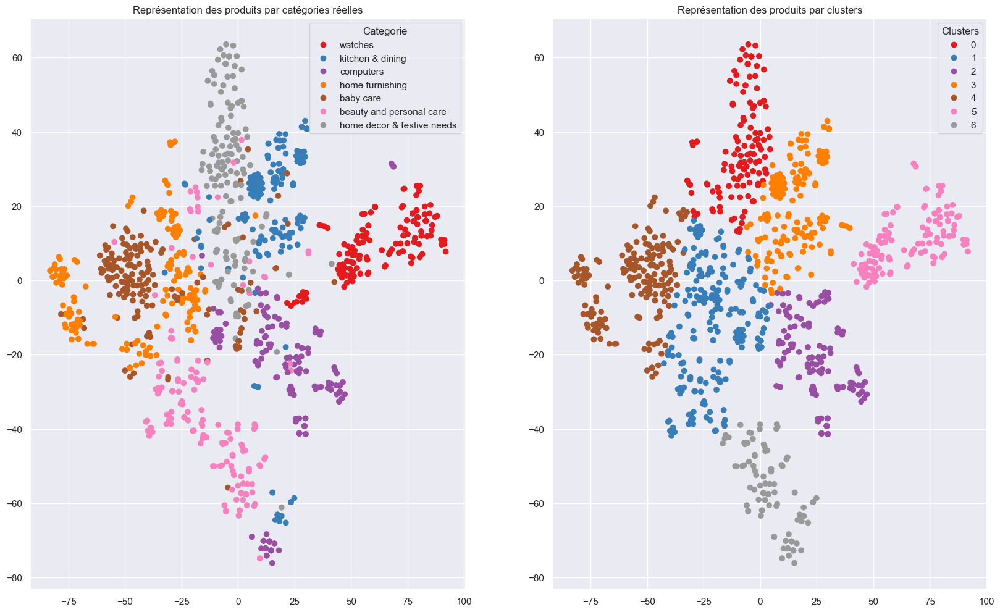

ARI :  0.4581


In [47]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

In [48]:
del modelpw2wgoogle

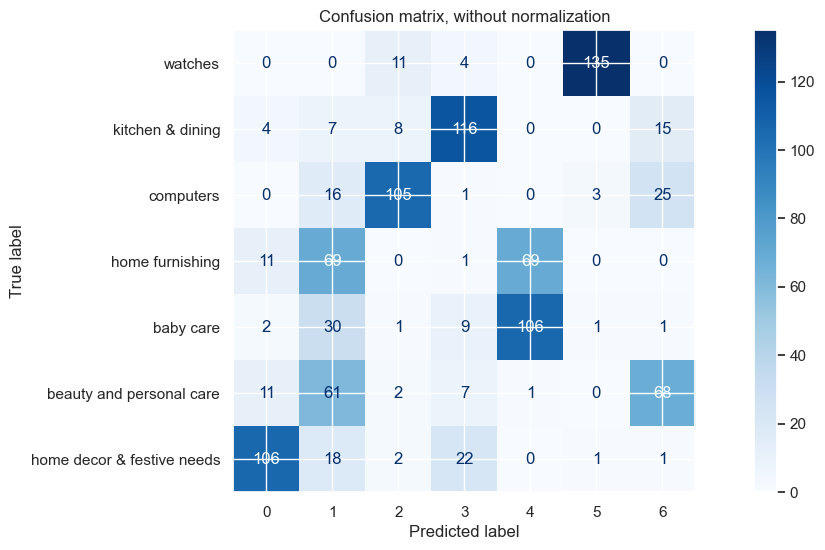

In [49]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 207)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.3747 time :  7.0


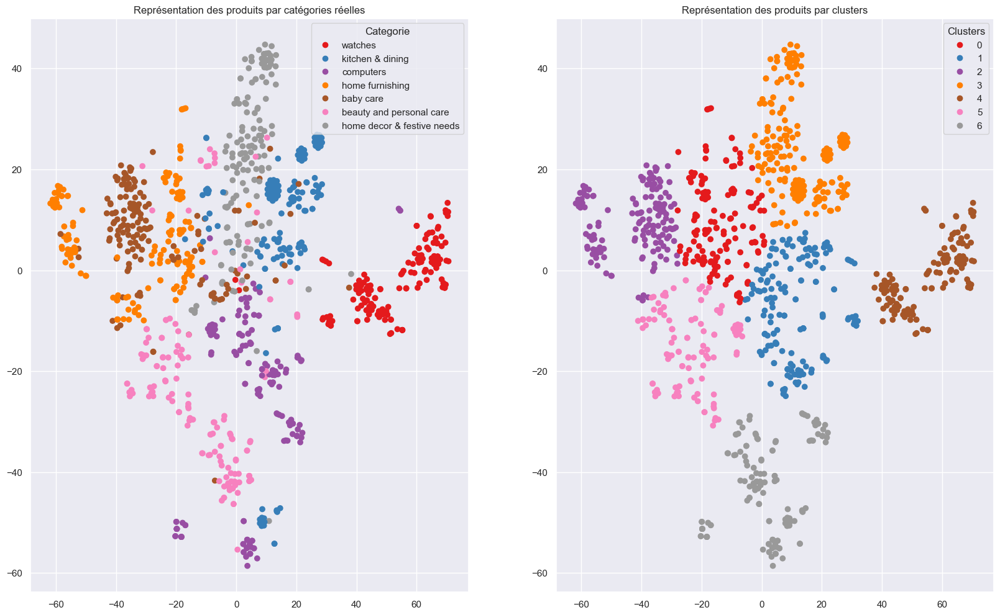

ARI :  0.3747


In [50]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(vectorized_docs))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

</Br>

### - <a name="C422"><font color='green'>4.2.b GloVe </font></a> 

#### <font color='green'>4.2.b.1 GloVe 300d </font>

In [51]:
print('Indexing word vectors.')

emmbed_dict = {}
f = open('data/support/glove.6B/glove.6B.300d.txt', encoding='utf-8')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    emmbed_dict[word] = coefs
f.close()

print('Found %s word vectors.' % len(emmbed_dict))

Indexing word vectors.
Found 400000 word vectors.


In [52]:
from scipy import spatial
def find_similar_word(emmbedes):
    nearest = sorted(emmbed_dict.keys(), key=lambda word: spatial.distance.euclidean(emmbed_dict[word], emmbedes))
    return nearest

find_similar_word(emmbed_dict['river'])[0:10]

['river',
 'rivers',
 'tributary',
 'confluence',
 'valley',
 'flows',
 'along',
 'creek',
 'estuary',
 'tributaries']

In [53]:
def find_closest_embeddings(embedding):
    return sorted(emmbed_dict.keys(), key=lambda word: spatial.distance.euclidean(emmbed_dict[word], embedding))

In [54]:
print(find_closest_embeddings(emmbed_dict["king"])[1:6])

['queen', 'monarch', 'prince', 'kingdom', 'reign']


In [55]:
print(find_closest_embeddings(
    emmbed_dict["king"] - emmbed_dict["man"] + emmbed_dict["woman"]
)[:5])

['king', 'queen', 'monarch', 'mother', 'princess']


In [56]:
from os.path import exists
file_exists = exists("data/support/glove.6B/gensim_glove_6B300dvectors.txt")

# check si le fichier existe sinon le crée à partir de ...
if not file_exists:
    # conversion ds vecteurs GloVe au format texte au format texte word2vec :
    from gensim.scripts.glove2word2vec import glove2word2vec
    glove2word2vec(glove_input_file="data/support/glove.6B/glove.6B.300d.txt", 
                   word2vec_output_file="data/support/glove.6B/gensim_glove_6B300dvectors.txt")

# Chargement du model glove
from gensim.models import KeyedVectors
glove_model = KeyedVectors.load_word2vec_format('data/support/glove.6B/gensim_glove_6B300dvectors.txt', binary=False)

In [57]:
vectorized_docs = vectorize(df.description_clean, model=glove_model)

# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringGlove, Glovecluster_labels = mbkmeans_clusters(
    X=vectorized_docs,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(Glovecluster_labels,df.cat_1)

For n_clusters = 7
Silhouette coefficient: 0.12
Inertia:3442.1948504534103
Silhouette values:
    Cluster 3: Size:85 | Avg:0.29 | Min:0.02 | Max: 0.47
    Cluster 0: Size:55 | Avg:0.24 | Min:0.02 | Max: 0.45
    Cluster 2: Size:141 | Avg:0.23 | Min:0.04 | Max: 0.39
    Cluster 1: Size:347 | Avg:0.13 | Min:-0.05 | Max: 0.24
    Cluster 5: Size:64 | Avg:0.06 | Min:-0.08 | Max: 0.18
    Cluster 6: Size:125 | Avg:0.02 | Min:-0.12 | Max: 0.17
    Cluster 4: Size:233 | Avg:0.01 | Min:-0.08 | Max: 0.10


Score ARI sur Avant diminution de dimension
ARI :  0.3211


In [58]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(vectorized_docs))

Score ARI après TSNE 2D + Clustering
ARI :  0.4432 time :  7.0


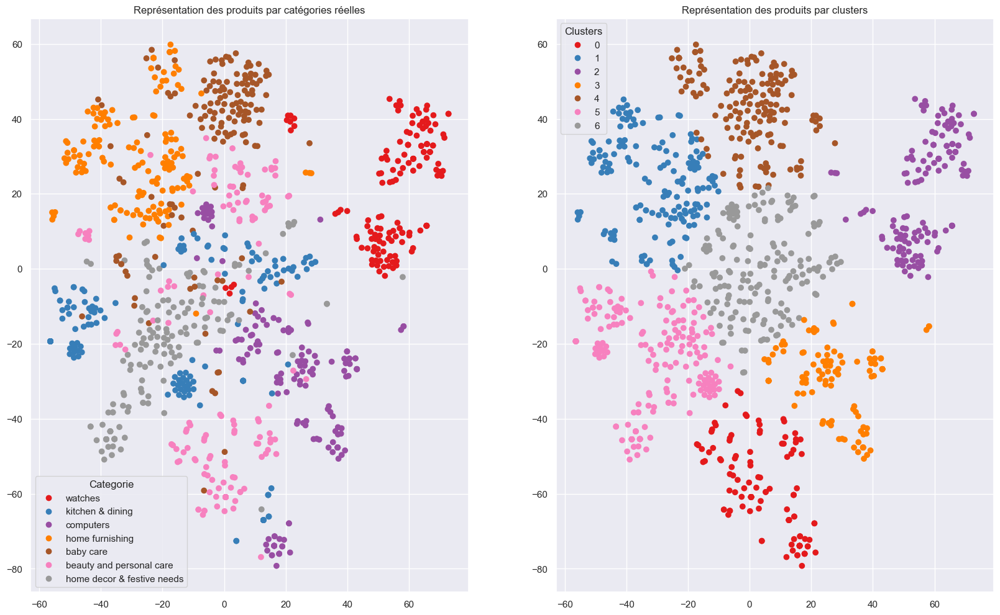

ARI :  0.4432


In [59]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

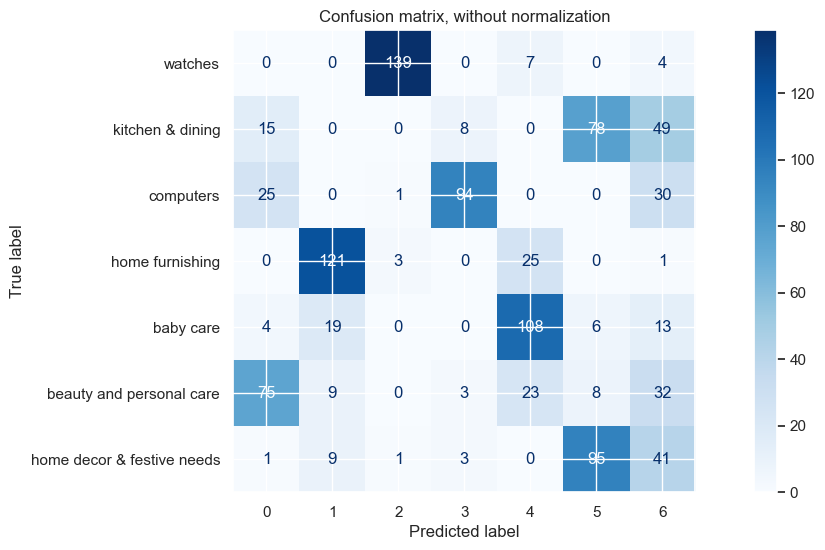

In [60]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 177)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.4255 time :  7.0


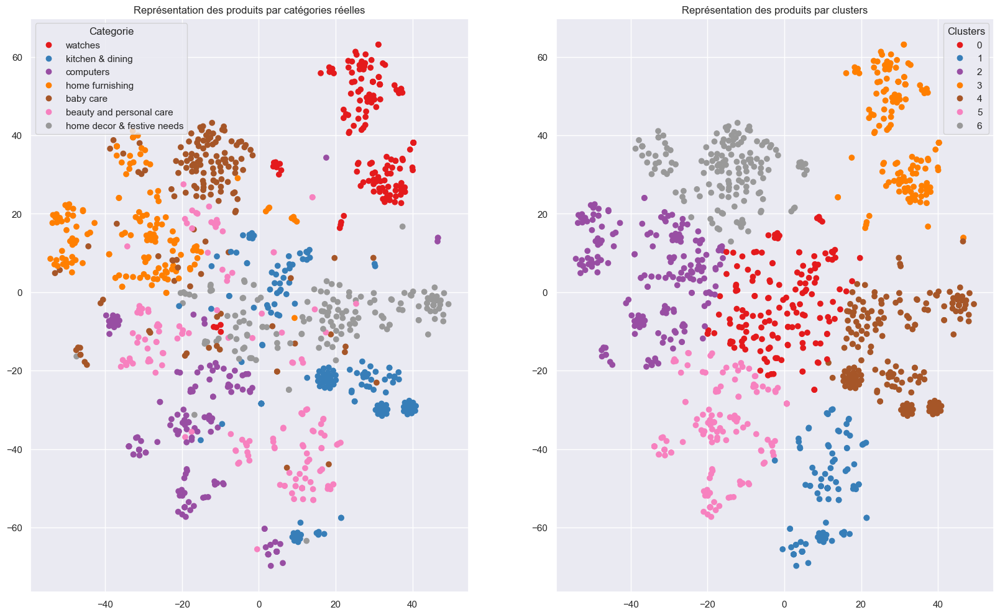

ARI :  0.4255


In [61]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(vectorized_docs))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

#### <font color='green'>4.2.b.1 GloVe 6B.50d </font>

In [62]:
from os.path import exists
file_exists = exists("data/support/glove.6B/gensim_glove_6B_50d_vectors.txt")

# check si le fichier existe sinon le crée à partir de ...
if not file_exists:
    # conversion ds vecteurs GloVe au format texte au format texte word2vec :
    from gensim.scripts.glove2word2vec import glove2word2vec
    glove2word2vec(glove_input_file="data/support/glove.6B/glove.6B.50d.txt", 
                   word2vec_output_file="data/support/glove.6B/gensim_glove_6B_50d_vectors.txt")

# Chargement du model glove
from gensim.models import KeyedVectors
glove_model6B50 = KeyedVectors.load_word2vec_format('data/support/glove.6B/gensim_glove_6B_50d_vectors.txt', binary=False)

In [63]:
vectorized_docs6B50 = vectorize(df.description_clean, model=glove_model6B50)

# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringGlove6B50, Glovecluster_labels6B50 = mbkmeans_clusters(
    X=vectorized_docs6B50,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(Glovecluster_labels6B50,df.cat_1)

For n_clusters = 7
Silhouette coefficient: 0.13
Inertia:1563.2884355894087
Silhouette values:
    Cluster 5: Size:80 | Avg:0.36 | Min:0.11 | Max: 0.50
    Cluster 2: Size:82 | Avg:0.31 | Min:-0.04 | Max: 0.49
    Cluster 3: Size:55 | Avg:0.25 | Min:-0.02 | Max: 0.47
    Cluster 4: Size:324 | Avg:0.12 | Min:-0.03 | Max: 0.23
    Cluster 6: Size:101 | Avg:0.12 | Min:-0.06 | Max: 0.28
    Cluster 1: Size:306 | Avg:0.06 | Min:-0.08 | Max: 0.19
    Cluster 0: Size:102 | Avg:0.03 | Min:-0.11 | Max: 0.19


Score ARI sur Avant diminution de dimension
ARI :  0.201



Score ARI après TSNE 2D + Clustering
ARI :  0.4123 time :  6.0


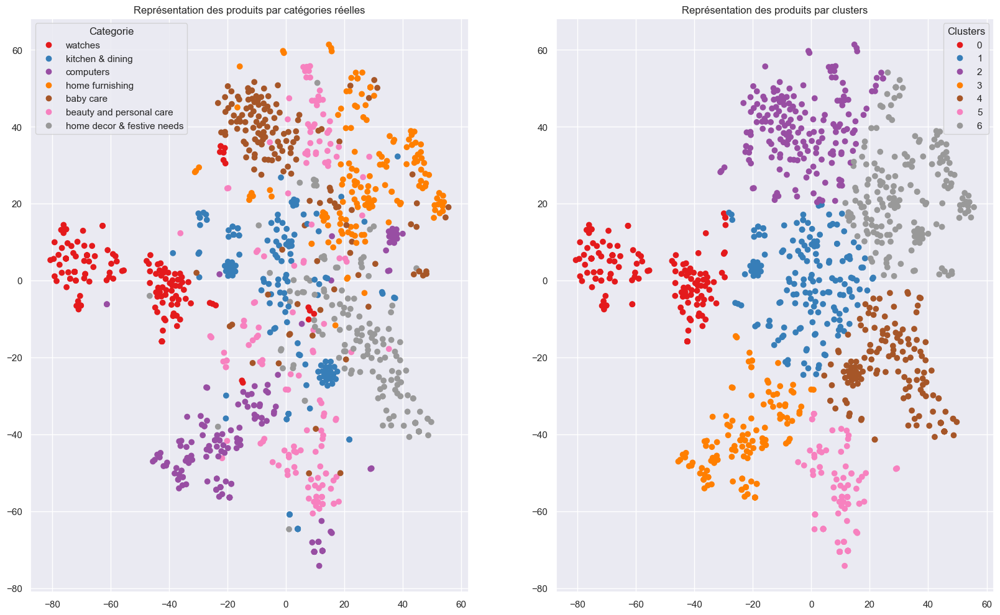

ARI :  0.4123


In [64]:
print( '\nScore ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(vectorized_docs6B50))
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 40)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.3738 time :  7.0


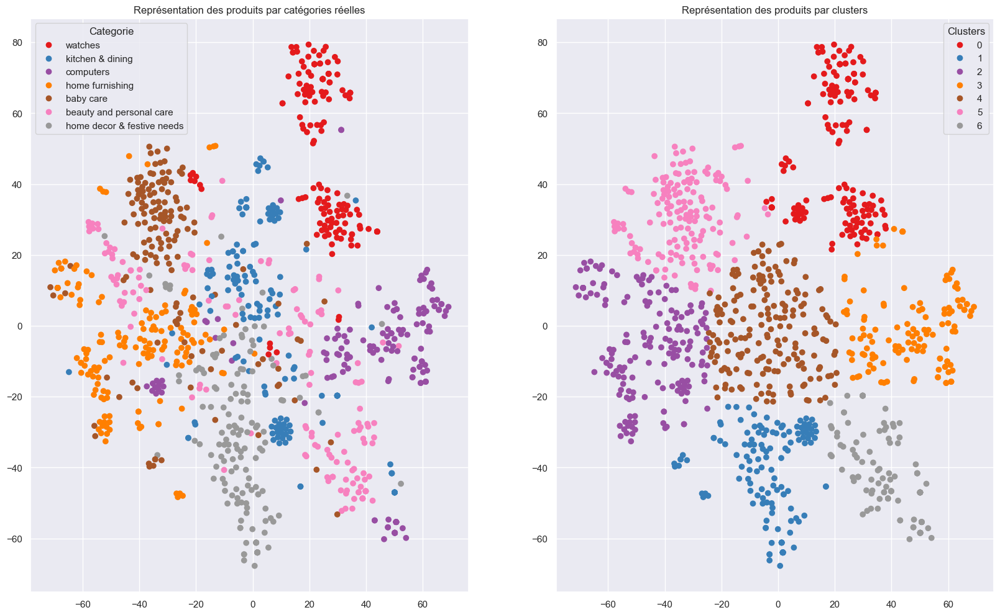

ARI :  0.3738


In [65]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(vectorized_docs6B50))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

In [66]:
del glove_model, glove_model6B50

</Br>

### - <a name="C423"><font color='green'>4.2.c FastText </font></a> 

#####  <font color='green'>4.2.c.1 FastText prélearning model </font>

######  <font color='green'>4.2.c.1.a FastText 1 million de vecteurs de mots entraînés sur Wikipedia 2017 </font>

In [67]:
from gensim.models import KeyedVectors
fasttext_model = KeyedVectors.load_word2vec_format('data/support/fasttext/wiki-news-300d-1M.vec')

vectorized_docs = vectorize(df.description_clean, model=fasttext_model)

# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringFastText, FastTextcluster_labels = mbkmeans_clusters(
    X=vectorized_docs,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(FastTextcluster_labels,df.cat_1)

For n_clusters = 7
Silhouette coefficient: 0.11
Inertia:298.4836349598508
Silhouette values:
    Cluster 5: Size:36 | Avg:0.52 | Min:0.12 | Max: 0.69
    Cluster 4: Size:137 | Avg:0.26 | Min:0.04 | Max: 0.39
    Cluster 2: Size:58 | Avg:0.22 | Min:-0.00 | Max: 0.45
    Cluster 0: Size:336 | Avg:0.06 | Min:-0.06 | Max: 0.14
    Cluster 3: Size:91 | Avg:0.06 | Min:-0.08 | Max: 0.19
    Cluster 6: Size:308 | Avg:0.05 | Min:-0.11 | Max: 0.13
    Cluster 1: Size:84 | Avg:0.04 | Min:-0.05 | Max: 0.15


Score ARI sur Avant diminution de dimension
ARI :  0.3424


In [68]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(vectorized_docs))

Score ARI après TSNE 2D + Clustering
ARI :  0.4174 time :  7.0


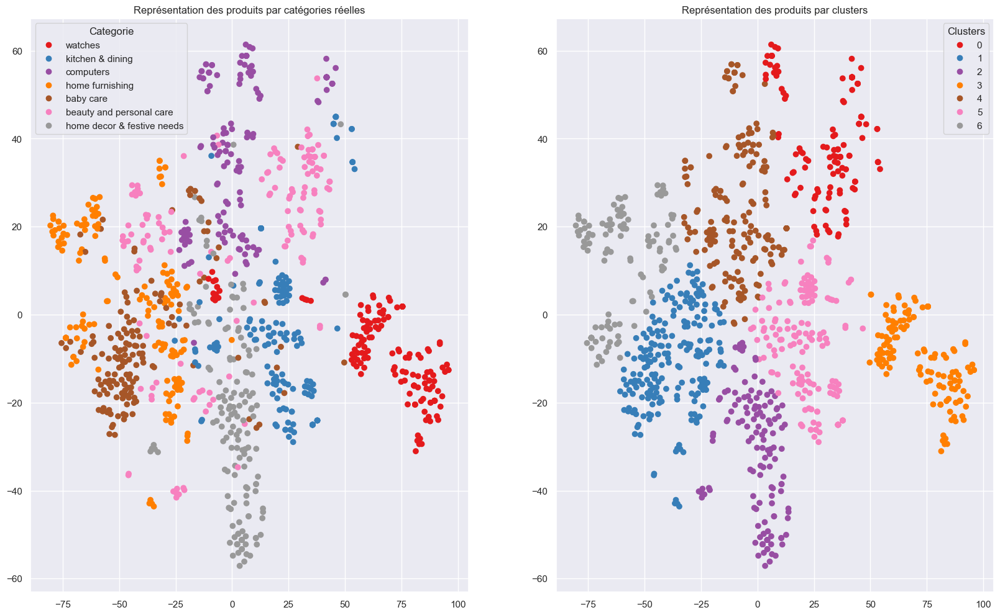

ARI :  0.4174


In [69]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

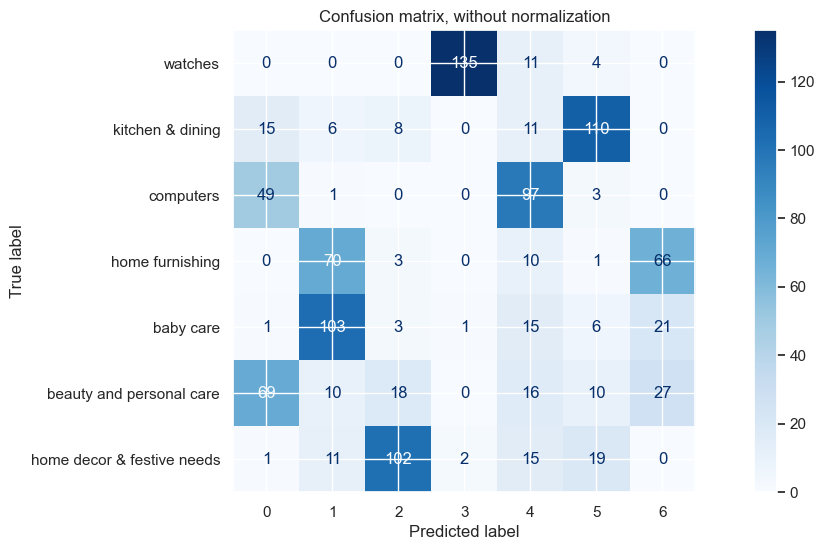

In [70]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 204)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.4373 time :  7.0


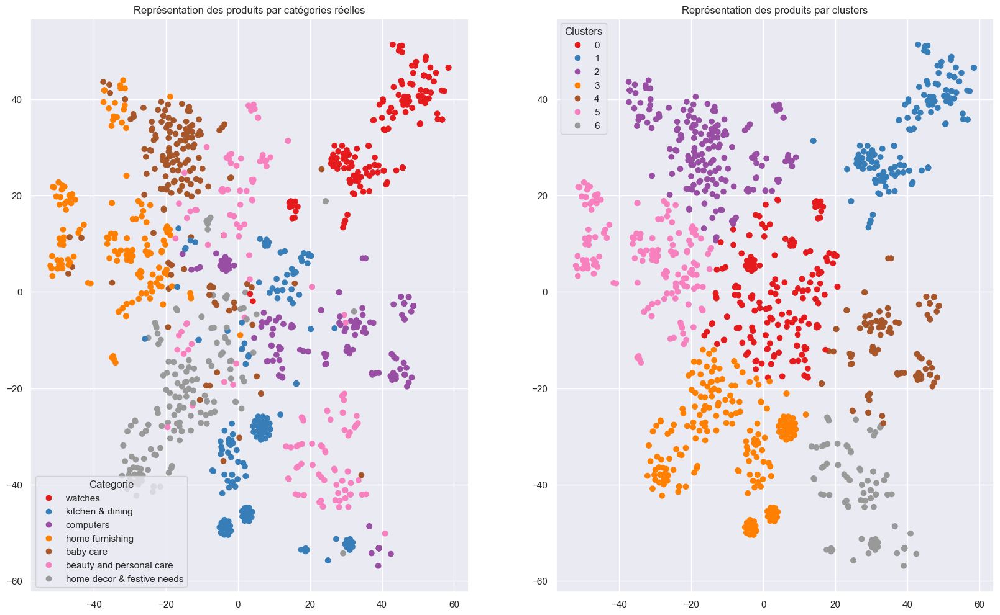

ARI :  0.4373


In [71]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(vectorized_docs))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

In [72]:
del fasttext_model, vectorized_docs

#####  <font color='green'>4.2.c.1.b  Fasttext 1 million de vecteurs de mots entraînés avec des informations de sous-mots sur Wikipedia 2017</font>

1050 300
For n_clusters = 7
Silhouette coefficient: 0.13
Inertia:14.89055792476594
Silhouette values:
    Cluster 4: Size:58 | Avg:0.27 | Min:0.01 | Max: 0.41
    Cluster 2: Size:141 | Avg:0.24 | Min:0.05 | Max: 0.39
    Cluster 5: Size:83 | Avg:0.20 | Min:-0.01 | Max: 0.34
    Cluster 3: Size:73 | Avg:0.19 | Min:-0.02 | Max: 0.41
    Cluster 0: Size:414 | Avg:0.10 | Min:-0.06 | Max: 0.19
    Cluster 6: Size:85 | Avg:0.05 | Min:-0.06 | Max: 0.19
    Cluster 1: Size:196 | Avg:0.02 | Min:-0.10 | Max: 0.11


Score ARI sur Avant diminution de dimension
ARI :  0.2806
Score ARI après TSNE 2D + Clustering
ARI :  0.3821 time :  6.0


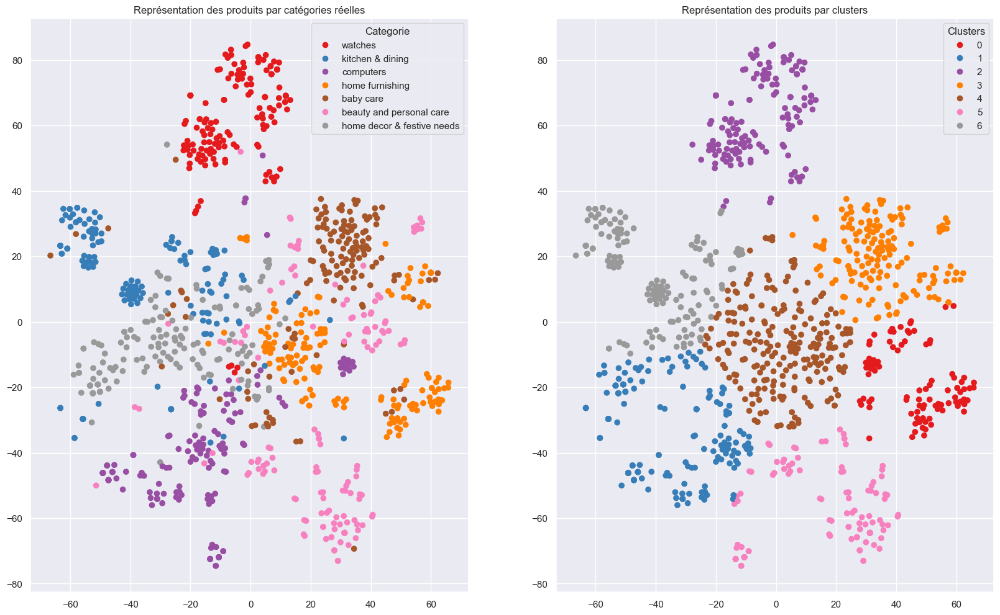

ARI :  0.3821


In [73]:
# Load pre-trained FastText model
model_pathsw1M = 'data/support/fasttext/wiki-news-300d-1M-subword.vec'
#modelsw1M = gensim.models.fasttext.load_facebook_vectors(model_pathsw1M)

modelsw1M = KeyedVectors.load_word2vec_format(model_pathsw1M)

# Define Document Vectors list from Word Embedding
vectorized_docssw1M = vectorize(df.description_clean, model=modelsw1M)
print(len(vectorized_docssw1M), len(vectorized_docssw1M[0]))


# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringFastTextsw1M, FastTextcluster_labelssw1M = mbkmeans_clusters(
    X=vectorized_docssw1M,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(FastTextcluster_labelssw1M,df.cat_1)

print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(vectorized_docssw1M))

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

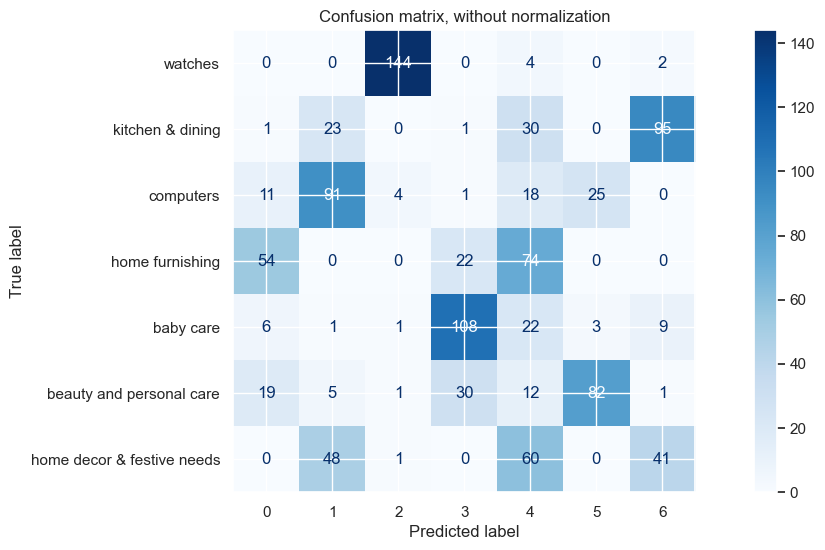

In [74]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 188)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.3963 time :  7.0


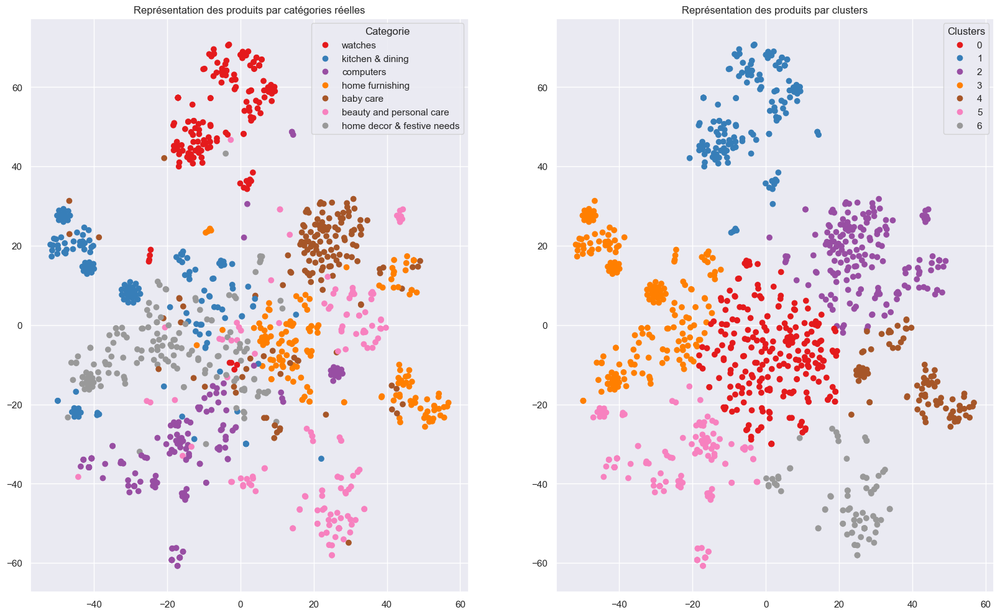

ARI :  0.3963


In [75]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(vectorized_docssw1M))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

#####  <font color='green'>4.2.c.2 FastText local train model </font>

In [76]:
from gensim.models.fasttext import FastText
model = FastText(vector_size=100, window=3)
model.build_vocab(corpus_iterable=df.description_clean)  # scan over corpus to build the vocabulary

total_words = model.corpus_total_words  # number of words in the corpus
model.train(corpus_iterable=df.description_clean, total_words=total_words, epochs=200)

(5532427, 7223000)

In [77]:
vectorized_docs = vectorize(df.description_clean, model=model.wv)

# utiliser un minibatch kmeans pas utils si donnée compte moins de 2000 echantillons
clusteringFastText, FastTextcluster_labels = mbkmeans_clusters(
    X=vectorized_docs,
    k=7,
    # mb=1024, # puissance de 2
    print_silhouette_values=True,
)
print('\n')
print('Score ARI sur Avant diminution de dimension')
_ = ARI_fct_raw(FastTextcluster_labels,df.cat_1)

For n_clusters = 7
Silhouette coefficient: 0.19
Inertia:24226.255737709864
Silhouette values:
    Cluster 2: Size:138 | Avg:0.45 | Min:0.00 | Max: 0.56
    Cluster 3: Size:87 | Avg:0.42 | Min:0.05 | Max: 0.53
    Cluster 6: Size:76 | Avg:0.40 | Min:0.12 | Max: 0.48
    Cluster 0: Size:83 | Avg:0.18 | Min:-0.11 | Max: 0.33
    Cluster 4: Size:257 | Avg:0.13 | Min:-0.08 | Max: 0.27
    Cluster 5: Size:193 | Avg:0.07 | Min:-0.14 | Max: 0.20
    Cluster 1: Size:216 | Avg:0.05 | Min:-0.11 | Max: 0.15


Score ARI sur Avant diminution de dimension
ARI :  0.3238


In [78]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(vectorized_docs))

Score ARI après TSNE 2D + Clustering
ARI :  0.4456 time :  6.0


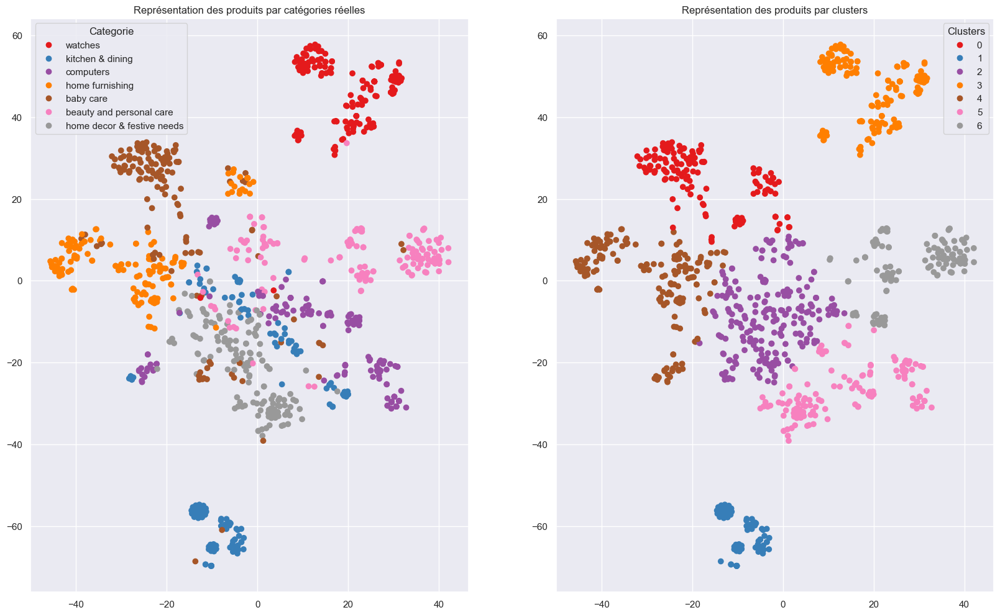

ARI :  0.4456


In [79]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

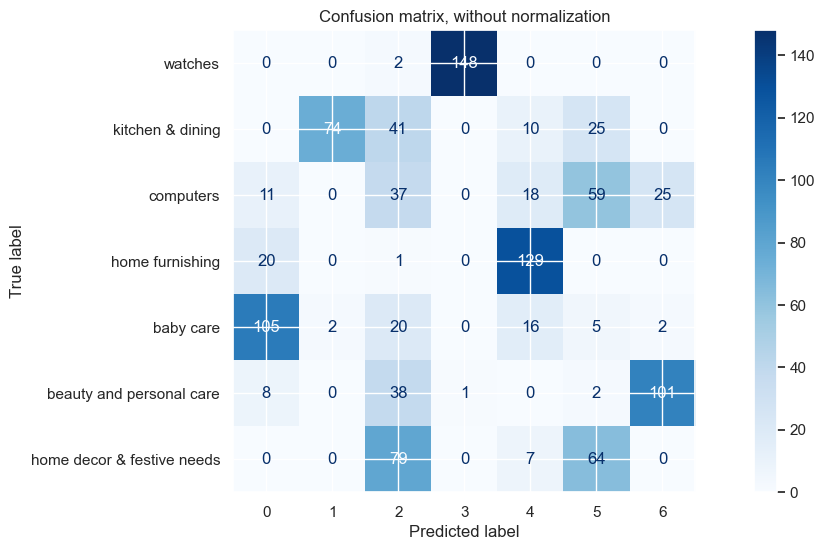

In [80]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 72)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.4482 time :  6.0


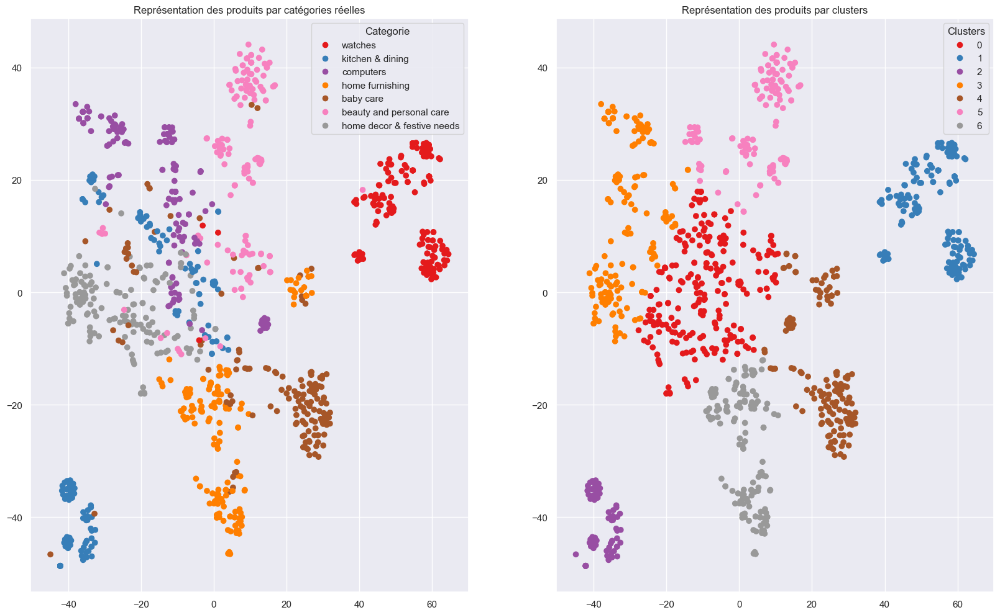

ARI :  0.4482


In [81]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(vectorized_docs))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

</Br>

### <a name="C424"><font color='green'>4.2.d Modélisez des sujets avec des méthodes non supervisées </font></a> 

#### <font color='green'> Latent Dirichlet Allocation (LDA) </font>

In [82]:
from sklearn.decomposition import LatentDirichletAllocation
n_topics = 300

# Créer le modèle LDA
lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

# Fitter sur les données
lda.fit(CountWord)

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=300, random_state=0)

Score ARI après TSNE 2D + Clustering
ARI :  0.4432 time :  6.0


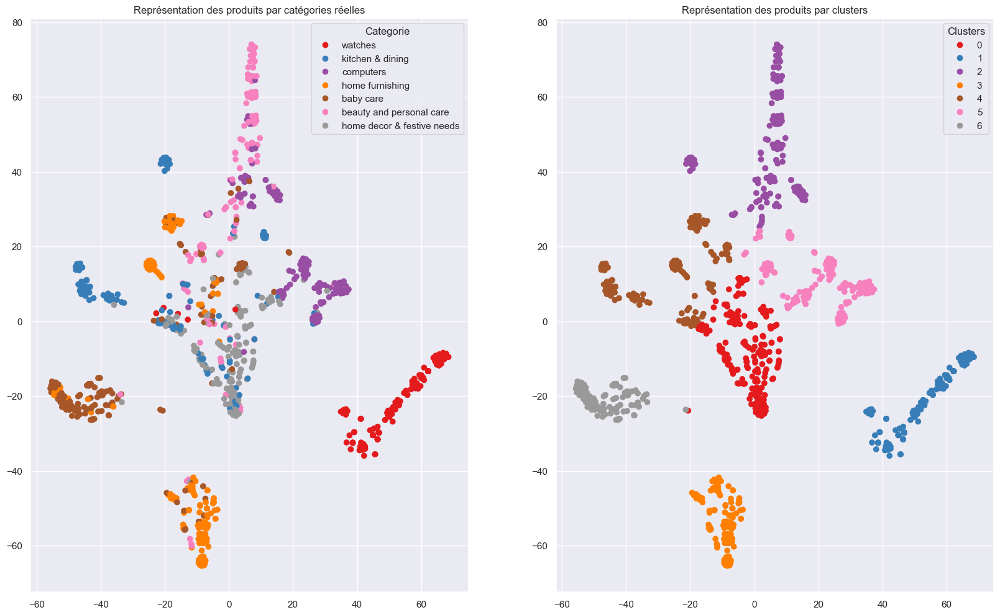

ARI :  0.4432


In [83]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(lda.transform(CountWord)))
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

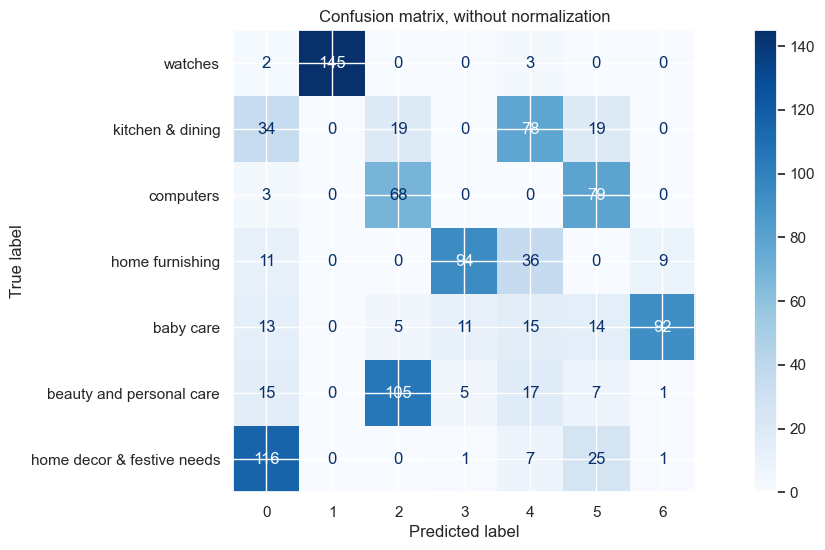

In [84]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 21)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.4491 time :  6.0


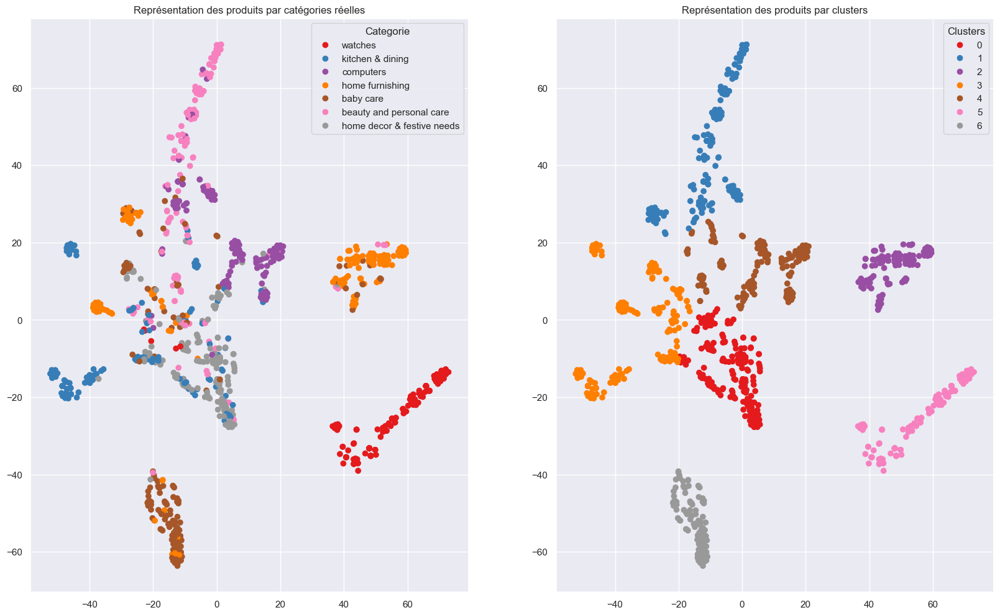

ARI :  0.4491


In [85]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform( pd.DataFrame(lda.transform(CountWord)) )
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

#### <font color='green'> NMF (Negative Matrix Factorisation) </font>

In [86]:
from sklearn.decomposition import NMF

# NMF is able to use tf-idf
no_topics = 100

# Run NMF
nmf = NMF(n_components=no_topics, random_state=1,  l1_ratio=.5, init='nndsvd')
nmf.fit(tfidf_values)

no_top_words = 10
#display_topics(nmf, TFIDF_df.columns, no_top_words)

Score ARI après TSNE 2D + Clustering
ARI :  0.3127 time :  7.0


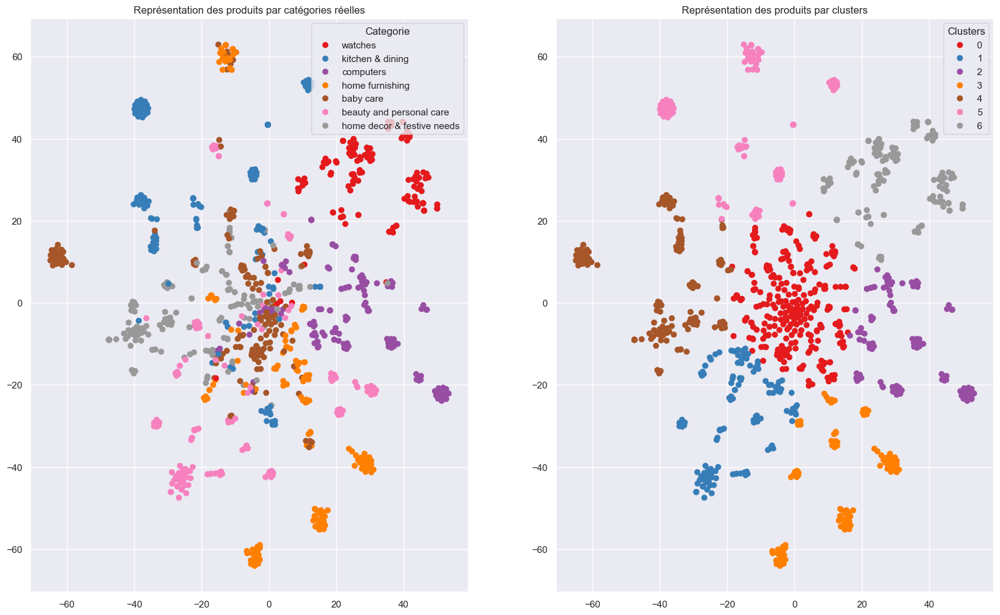

ARI :  0.3127


In [87]:
print( 'Score ARI après TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(pd.DataFrame(nmf.transform(TFIDF_df)))
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

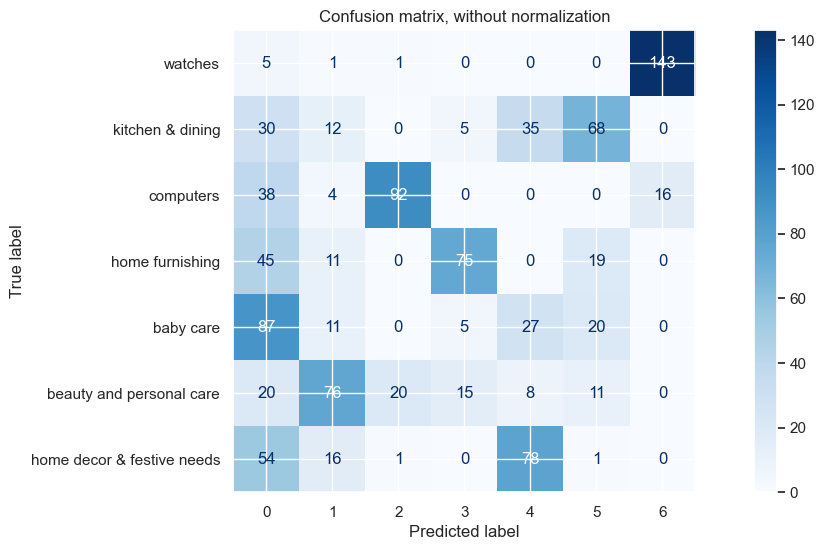

In [88]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 21)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.4491 time :  6.0


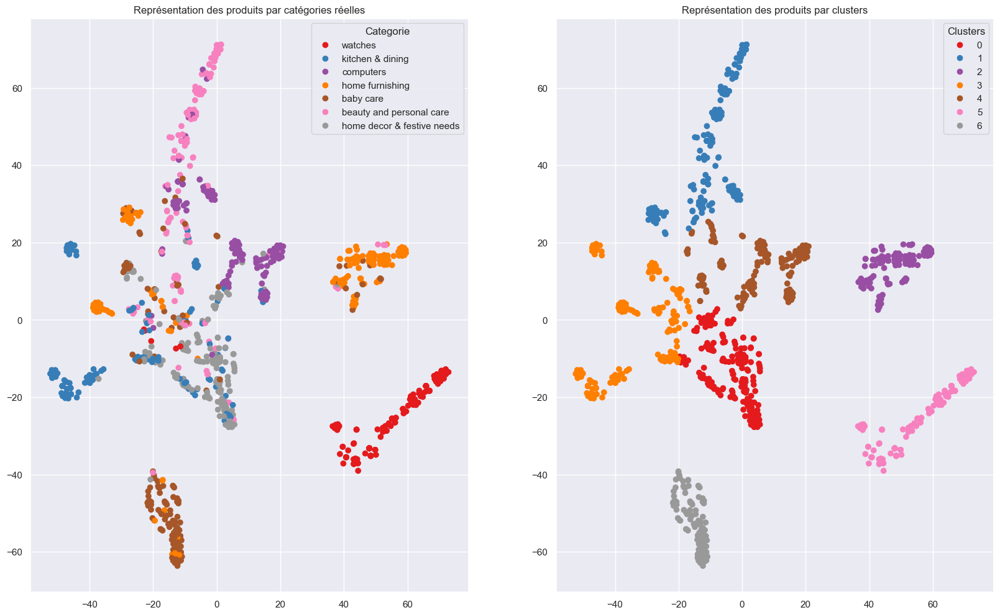

ARI :  0.4491


In [89]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform( pd.DataFrame(lda.transform(CountWord)) )
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

### <a name="C43"><font color='green'>4.3 Effectuez des plongements de mots (word embeddings) </font></a> 

### Fonctions communes

In [90]:
def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
from nltk.corpus import stopwords
stop_w = list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', '?', '(', ')']

def stop_word_filter_fct(list_words) :
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Lemmatizer (base d'un mot)
from nltk.stem import WordNetLemmatizer

def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Fonction de préparation du texte pour le bag of words avec lemmatization
def transform_bow_lem_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lem_w)
    return transf_desc_text

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
#    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(word_tokens)
    # lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lw)
    return transf_desc_text


df['sentence_bow_lem'] = df['description'].apply(lambda x : transform_bow_lem_fct(x))
df['sentence_dl'] = df['description'].apply(lambda x : transform_dl_fct(x))

</Br>

</Br>

</Br>

#### <a name="C431"><font color='green'>4.3.a BERT </font></a> 

In [91]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os
import transformers
#from transformers import *

os.environ["TF_KERAS"]='1'

In [92]:
print(tf.__version__)
print(tensorflow.__version__)
print("Number of GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.10.0
2.10.0
Number of GPUs Available:  0
False


### Fonctions communes

In [93]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = transformers.AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

</Br>

## BERT HuggingFace

### 'bert-base-uncased'

In [94]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = transformers.TFAutoModel.from_pretrained(model_type)
sentences = df['sentence_bow_lem'].to_list()

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['mlm___cls', 'nsp___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [95]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

1/1 [==============================] - 0s 396ms/step
temps traitement :  56.0


In [96]:
ARI, X_tsne, labels = ARI_fct(features_bert)

ARI :  0.3516 time :  7.0


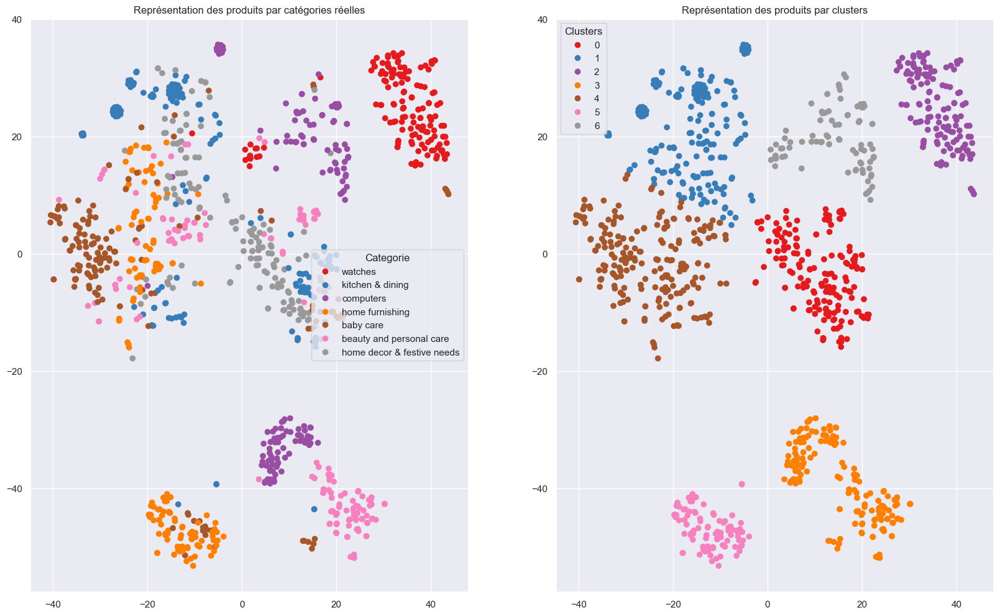

ARI :  0.3516


In [97]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

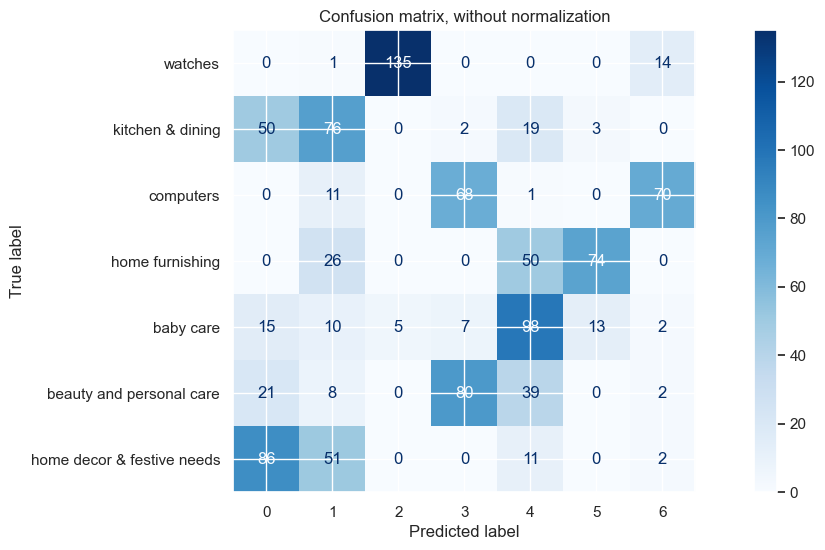

In [98]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 318)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.3482 time :  6.0


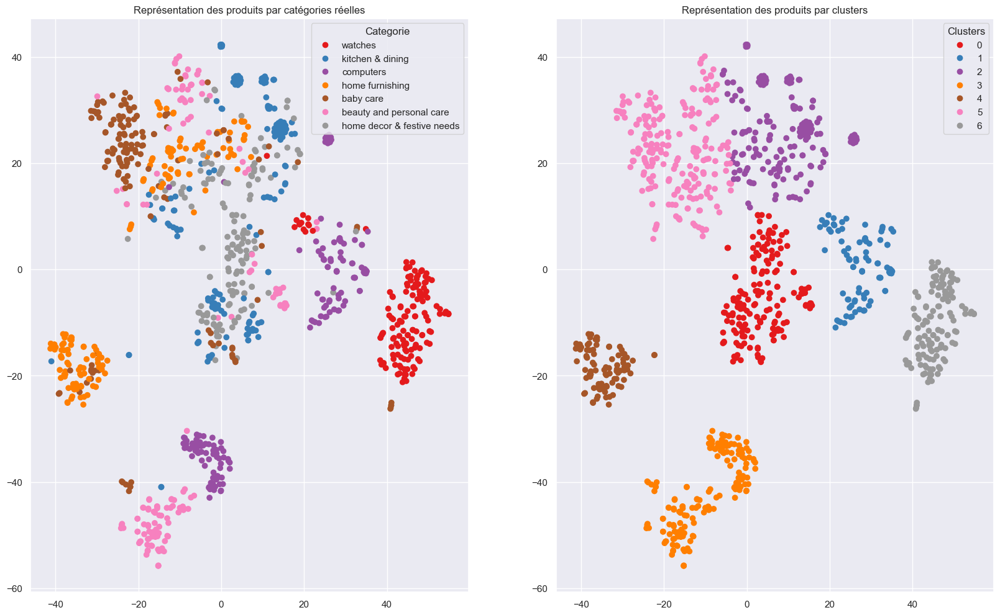

ARI :  0.3482


In [99]:
import warnings
warnings.filterwarnings("ignore")

print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(features_bert))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

### 'cardiffnlp/twitter-roberta-base-sentiment'
* Modèle pré-entraîné sur des tweets pour l'analyse de sentiment = particulièrement adapté au contexte

In [100]:
max_length = 64
batch_size = 10
model_type = 'cardiffnlp/twitter-roberta-base-sentiment'
model = transformers.TFAutoModel.from_pretrained(model_type)
sentences = df['sentence_bow_lem'].to_list()

Some layers from the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment were not used when initializing TFRobertaModel: ['classifier']
- This IS expected if you are initializing TFRobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFRobertaModel were initialized from the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFRobertaModel for predictions without further training.


In [101]:
features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

1/1 [==============================] - 0s 399ms/step
temps traitement :  56.0


In [102]:
ARI, X_tsne, labels = ARI_fct(features_bert)

ARI :  0.2602 time :  6.0


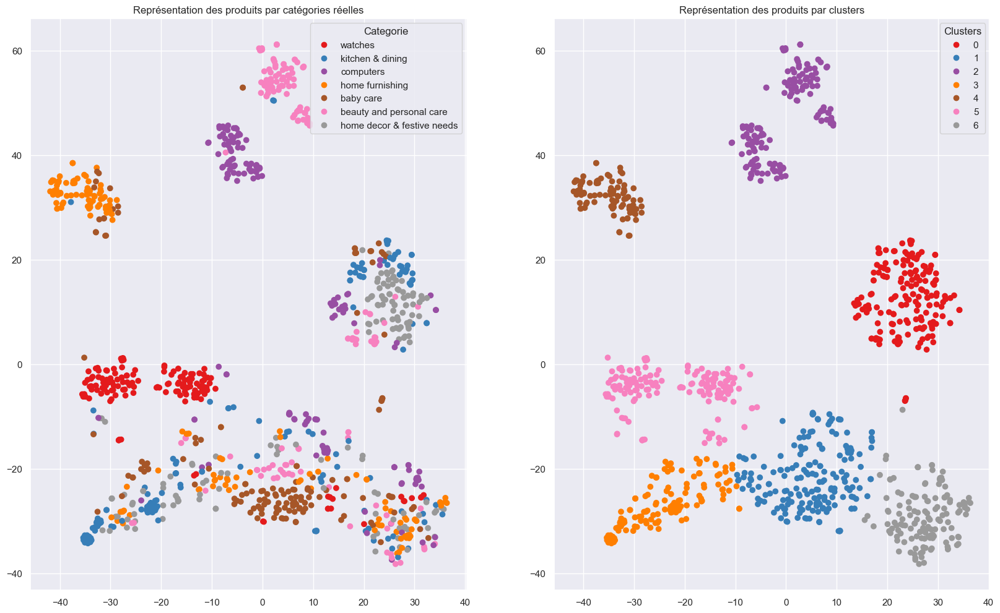

ARI :  0.2602


In [103]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

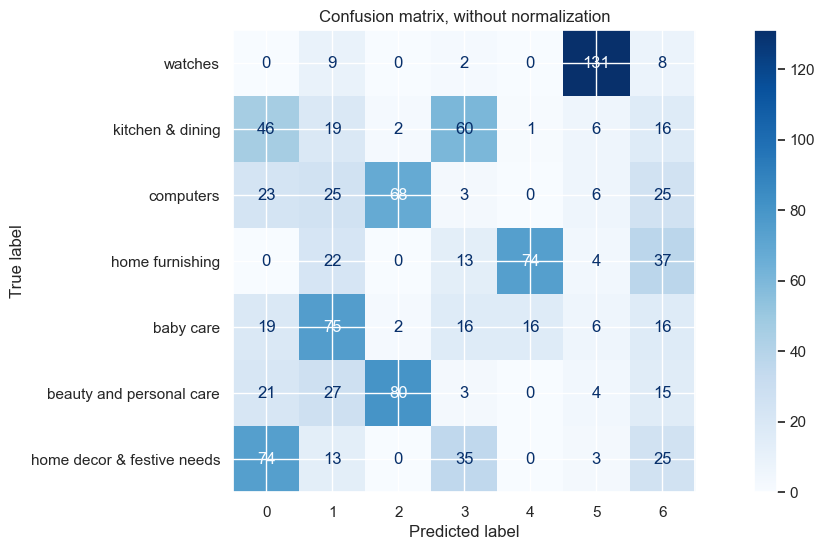

In [104]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 195)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.2601 time :  6.0


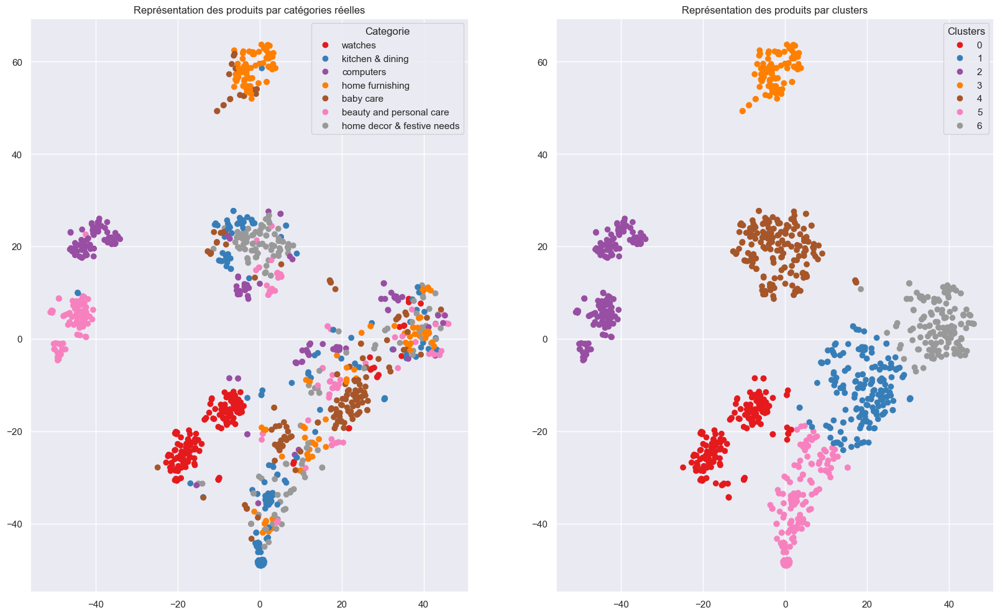

ARI :  0.2601


In [105]:
import warnings
warnings.filterwarnings("ignore")

print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(features_bert))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

</Br>

#### <a name="C432"><font color='green'>4.3.b USE - Universal Sentence Encoder </font></a> 

In [117]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import transformers
#from transformers import *

os.environ["TF_KERAS"]='1'

In [118]:
print(tf.__version__)
print(tensorflow.__version__)
print("Numer of GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.10.0
2.10.0
Numer of GPUs Available:  0
False


In [119]:
import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [120]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [121]:
df.head()

,uniq_id,image,description,description_clean,cat_1,sentence_bow_lem,sentence_dl
0,55b85ea15a1536d46b7190ad6fff8ce7,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,"[key, feature, elegance, polyester, multicolor...",home furnishing,key feature elegance polyester multicolor abst...,key features of elegance polyester multicolor ...
1,7b72c92c2f6c40268628ec5f14c6d590,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,"[specification, cotton, bath, towel, bath, tow...",baby care,specification sathiyas cotton bath towel bath ...,specifications of sathiyas cotton bath towel (...
2,64d5d4a258243731dc7bbb1eef49ad74,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,"[key, feature, cotton, terry, face, towel, set...",baby care,key feature eurospa cotton terry face towel se...,key features of eurospa cotton terry face towe...
3,d4684dcdc759dd9cdf41504698d737d8,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[key, feature, royal, fashion, cotton, print, ...",home furnishing,key feature santosh royal fashion cotton print...,key features of santosh royal fashion cotton p...
4,6325b6870c54cd47be6ebfbffa620ec7,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,"[key, feature, print, cotton, floral, king, si...",home furnishing,key feature jaipur print cotton floral king si...,key features of jaipur print cotton floral kin...


In [122]:
batch_size = 10
sentences = df['sentence_bow_lem'].to_list()

In [123]:
features_USE = feature_USE_fct(sentences, batch_size)

In [124]:
ARI, X_tsne, labels = ARI_fct(features_USE)

ARI :  0.4096 time :  7.0


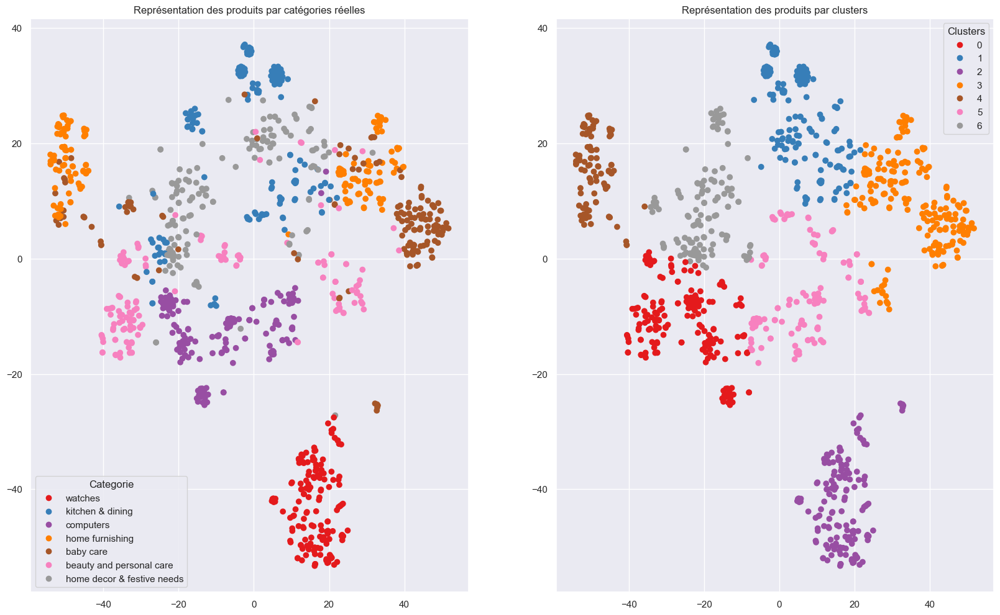

ARI :  0.4096


In [125]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

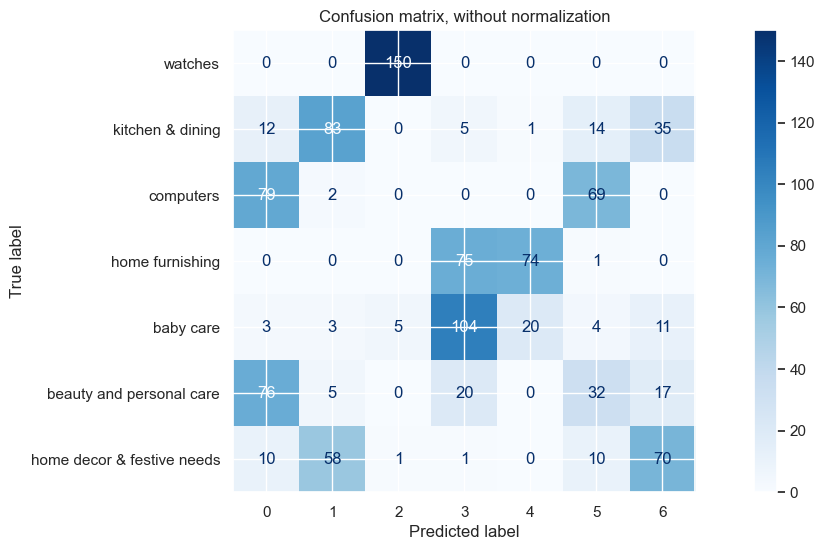

In [126]:
plot_confusion_matrix(y_cat_num, labels,class_labels=l_cat,normalize_f=None)

________________ Reduction PCA ________________
(1050, 1415)
(1050, 320)
Score ARI après PCA + TSNE 2D + Clustering
ARI :  0.4391 time :  7.0


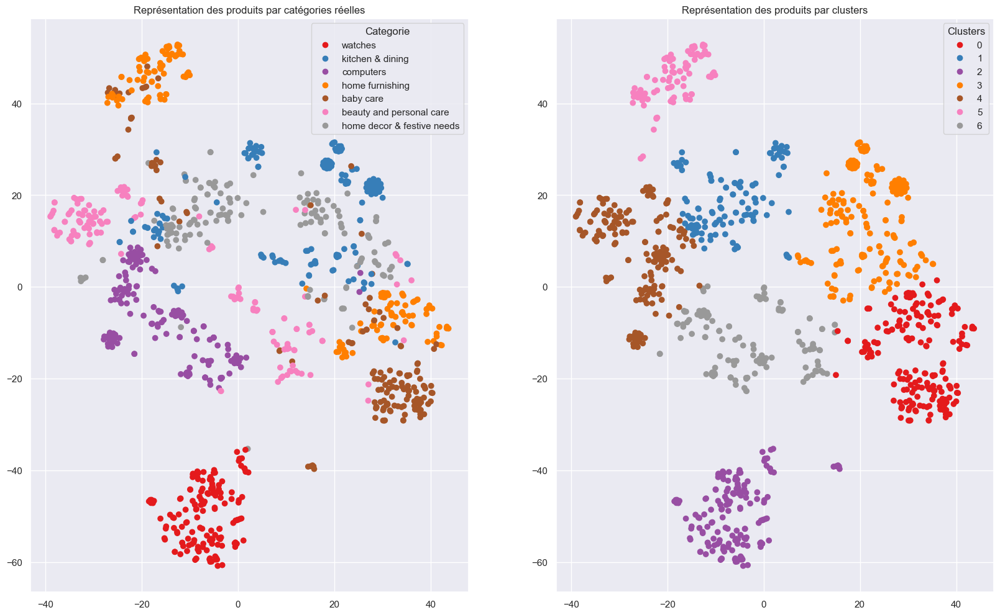

ARI :  0.4391


In [127]:
import warnings
warnings.filterwarnings("ignore")


print('________________ Reduction PCA ________________')
print(CountWord.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(pd.DataFrame(features_USE))
print(feat_pca.shape)

print( 'Score ARI après PCA + TSNE 2D + Clustering')
ARI, X_tsne, labels = ARI_fct(feat_pca)

TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

</Br>

</br>

</br>

</br>